# Summary of Saitta et. al. (2020) - "An Effect Size Statistical Framework for Investigating Sexual Dimorphism in Non-avian Dinosaurs and Other Extinct Taxa"

This paper is largely looking at a novel way of looking at and detecting sexual dimorphism, and specifically sexual size dimorphsim (SSD), in extinct taxa. They note that despite the fact that SSD is widespread today, there is little evidence that it existed in dinosaurs. This seems strange; it could be that dinosaurs were unique in that there was some process that selected against sexual dimorphism, or it could be that the techniques that we're using are not fit for purpose. The authors propose using a method which looks at the asymptotic size of different sexes and using that as a measure of sexual dimorphism. This neatly sidesteps one of the issues with discovering it so far, first raise (as far as I know) in Hone and Mallon (2017) - the fact that having fossils with different ages makes testing for sexual size dimorphism very difficult and prone to false negatives. By using the growth curve of the taxa, they actually rely on having this information.

The first thing they do is go through an examination of the significance of sexual dimorphism, including a summary of previous work on extinct taxa and its role in modern ecology. They also go through various explanations for why it has been difficult to find definitive examples of sexual dimorphism in the fossil record: namely the Species Recognition Hypothesis and the Mutual Sexual Selection Hypothesis. They conclude that these are unlikely to be the true cause, and it is more likely that the fault lies with the statistical methods employed thus far.

The next step is to examine these existing methods!

## Previous Methods

### Bimodality method

The first commonly used method is to use the Hartigan Dip Test for Unimodality (Hartigan, 1985). This test is calculated based on an assumption of unimodality, and so any low $p$ value can be interpreted as evidence against this hypothesis and therefore as evidence for bimodality (or three modes, or essentially any number of modes greater than 1). An excellent visual explanation of the test is presented [here](https://skeptric.com/dip-statistic/index.html). This is relevant in the context of looking for evidence of sexual dimorphism because the assumption is that if you are looking at some sort of trait and see two peaks, it could be that those are the result of the final distribution being a combination of two dimorphic distributions, and would thus be evidence for sexual dimorphism (with the usual caveats that dimorphism need not necessarily be sexual in nature).

Before we move on to the downsides the authors point out with this method, let's take a look at some example distributions and the results of the Hartigan Dip Test to get a feel for what this test is telling us. For simplicity I'll stick with bimodal distributions.

In [2]:
# first load all necesary library, utility functions, &c.
library(diptest)
library(ggplot2)
library(FSA) # for the vbStart function to find good parameters for the von Bertalanffy function
library(propagate) # for quantifying the uncertainty of the curve fit
library(minpack.lm) # a more robust version of nls for non-linear curve fitting to avoid problems with e.g. very small sample sizes

custom_theme <- function() {
  theme_minimal() +
    theme(
      panel.background = element_rect(fill = "white"),
      panel.grid.major = element_line(color = alpha("black", 0.5), linetype = "dotted", linewidth = 0.5),
      panel.grid.minor = element_blank(),
      axis.text = element_text(size = 12),  # Adjust the font size of axis labels
      axis.title = element_text(size = 16),  # Adjust the font size of axis titles
      plot.title = element_text(size = 20, hjust = 0.5),  # Adjust the font size and center the plot title
      plot.subtitle = element_text(size = 16, hjust = 0.5)  # Adjust the font size and center the plot subtitle
    )
}
options(repr.plot.width=15, repr.plot.height=8)

## FSA v0.9.5. See citation('FSA') if used in publication.
## Run fishR() for related website and fishR('IFAR') for related book.

Loading required package: MASS

Loading required package: tmvtnorm

Loading required package: mvtnorm

Loading required package: Matrix

Loading required package: stats4

Loading required package: gmm

Loading required package: sandwich

Loading required package: Rcpp

Loading required package: ff

Loading required package: bit


Attaching package: ‘bit’


The following object is masked from ‘package:base’:

    xor


Attaching package ff

- getOption("fftempdir")=="/var/folders/86/1fgck35j5s9g7_r3_8y8txcc0000gn/T//RtmpyNCdVM/ff"


- getOption("ffextension")=="ff"


- getOption("ffdrop")==TRUE


- getOption("fffinonexit")==TRUE


- getOption("ffpagesize")==65536


- getOption("ffcaching")=="mmnoflush"  -- consider "ffeachflush" if your system stalls on large writes


- getOption("ffbatchbytes")==16777216 -- consider a different value for tuning your system


Before we dive too deeply into that, let's look at one example in detail. First, we'll generate two samples: one from a normal distribution (unimodal) and one combined sample from two different normal distributions with different means (a bimodal sample).

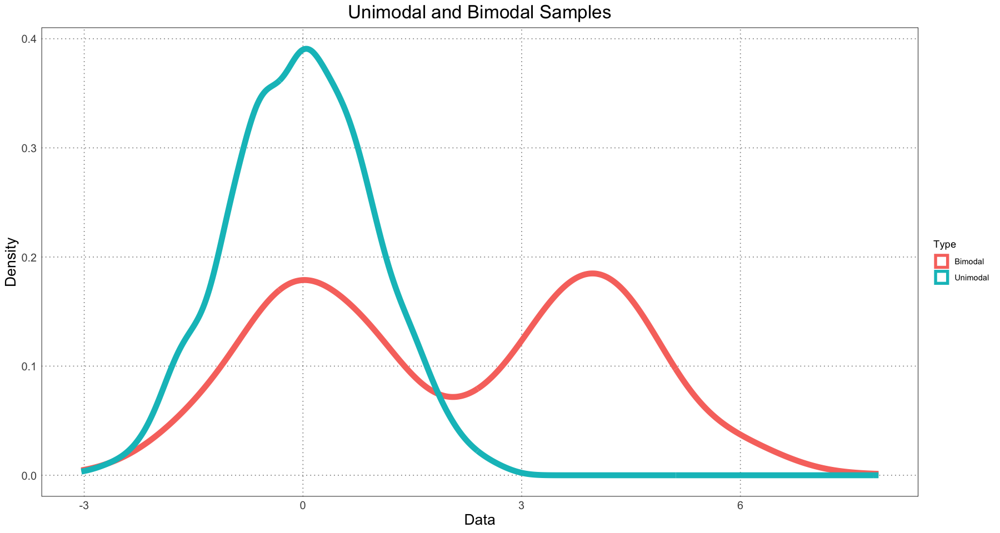

In [144]:
unimodal_sample <- rnorm(1e3, mean = 0, sd = 1)
bimodal_sample <- c(
    rnorm(5*1e2, mean = 0, sd = 1),
    rnorm(5*1e2, mean = 4, sd = 1)
)

sample_df <- data.frame(data = c(unimodal_sample, bimodal_sample), type = rep(c("Unimodal", "Bimodal"), each = 1e3))

ggplot(sample_df, aes(data, group = type, colour = type)) +
    geom_density(linewidth=3) +
    custom_theme() +
    labs(title = "Unimodal and Bimodal Samples", x = "Data", y = "Density", colour = "Type")

Now let's look at the unimodal sample. We'll use Hartigans' Dip Test and compute a $p$ value against the null hypothesis of unimodality. Since the distribution is in fact unimodal, we expect a very high value (hopefully close to 1).

In [127]:
# test the sample, using B = 1e4 Monte Carlo replicates. See the documentation for more details
hdt <- dip.test(unimodal_sample, simulate.p.value = TRUE, B = 1e4)
hdt


	Hartigans' dip test for unimodality / multimodality with simulated
	p-value (based on 10000 replicates)

data:  unimodal_sample
D = 0.0076326, p-value = 0.9881
alternative hypothesis: non-unimodal, i.e., at least bimodal


As per the documentation, `hdt` is a list containing a few different attributes related to the test. For us, the most relevant one is `p.value`.

In [128]:
hdt$p.value

[1] 0.9881

As expected, it is close to 1. Now let's try the same thing for the bimodal distribution!

In [129]:
(hdt_bimodal <- dip.test(bimodal_sample, simulate.p.value = TRUE, B = 1e4))


	Hartigans' dip test for unimodality / multimodality with simulated
	p-value (based on 10000 replicates)

data:  bimodal_sample
D = 0.038303, p-value < 2.2e-16
alternative hypothesis: non-unimodal, i.e., at least bimodal


In [130]:
hdt_bimodal$p.value

[1] 0

Here, as we expect, the $p$ value is essentially zero, allowing us to reject the null hypothesis of unimodality.

Note that in all of the above we are using a Monte Carlo simulation to generate the $p$ value. This process can be somewhat time-intensive (it take my computer roughly 2 -- 3 seconds to compute it with 10 000 replicates). There is another way to compute the $p$ value by using a lookup table, and in fact this is the default behaviour (controlled by the `simulate.p.value` parameter). However, to keep with the method employed in the paper I will use the Monte Carlo method. I am unclear as to the advantages of this method, and to be honest the entire test is slightly opaque to me. Definitely an area for further study!

Great! Now that we have looked at a few examples, let's look at a wider range of bimodalities to get a sense for the results of the test.

In [131]:
# generates a bimodal sample by combining two normal distributions with the same standard deviation
generate_bimodal <- function(mu1, mu2, sd, num_samples = 1e4) {
    c(
        rnorm(num_samples / 2, mean = mu1, sd = sd),
        rnorm(num_samples / 2, mean = mu2, sd = sd)
    )
}

df <- data.frame(data = numeric(), p = numeric(), mu2 = numeric())
for (mu2 in seq(0, 4, by = 0.5)) {
    data <- generate_bimodal(mu1 = 0, mu2 = mu2, sd = 1)
    simulated_p_value <- dip.test(data, simulate.p.value = TRUE, B = 1e4)$p.value
    interim_df <- data.frame(data = data, p = simulated_p_value, mu2 = mu2)
    df <- rbind(df, interim_df)
}

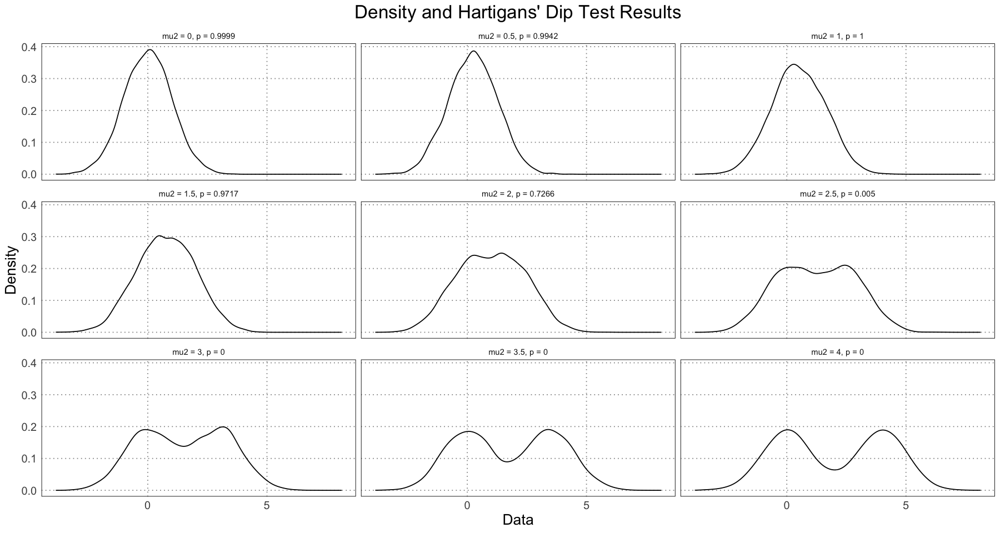

In [132]:
df$label <- paste("mu2 = ", df$mu2, ", ", "p = ", trunc(df$p * 1e5) / 1e5, sep = '')
ggplot(df, aes(data)) +
    geom_density() +
    facet_wrap(vars(label)) +
    labs(title = 'Density and Hartigans\' Dip Test Results', x = 'Data', y = "Density") +
    custom_theme()

Note that just by examining the density plots, we can see that we don't see bimodality occurring until the difference in the means was greater than $2\sigma$. This is not just a result of our data, but something that will always be true; if the distributions have means that are too close, the resulting distribution will be unimodal. In addition, note that the $p$ value changes very rapidly between $\mu_2 = 2$ (unimodal) and $\mu_2 = 3$ (bimodal). In fact, let's zoom in on this area to see this change in more detail.

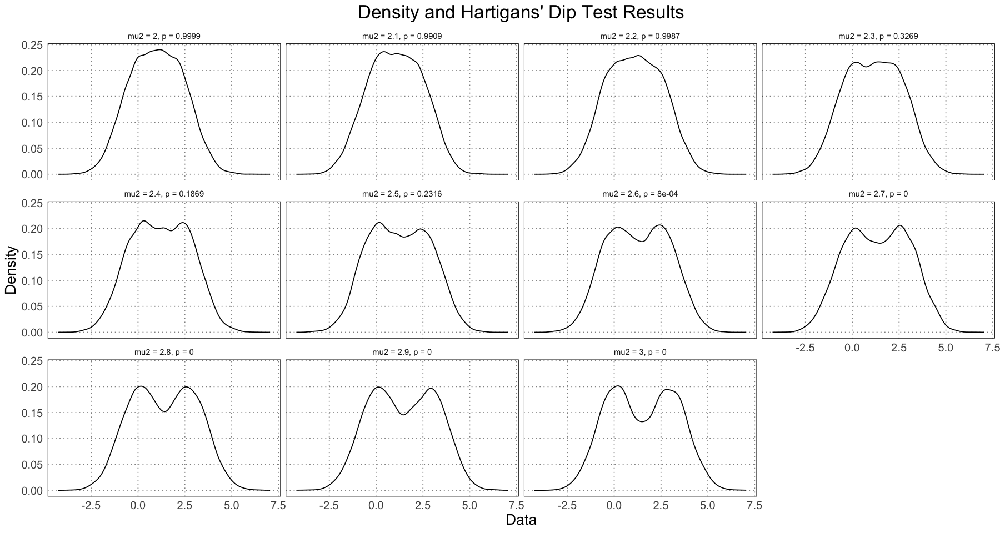

In [133]:
df <- data.frame(data = numeric(), p = numeric(), mu2 = numeric())
for (mu2 in seq(2, 3, by = 0.1)) {
    data <- generate_bimodal(mu1 = 0, mu2 = mu2, sd = 1)
    simulated_p_value <- dip.test(data, simulate.p.value = TRUE, B = 1e4)$p.value
    interim_df <- data.frame(data = data, p = simulated_p_value, mu2 = mu2)
    df <- rbind(df, interim_df)
}
df$label <- paste("mu2 = ", df$mu2, ", ", "p = ", trunc(df$p * 1e5) / 1e5, sep = '')
ggplot(df, aes(data)) +
    geom_density() +
    facet_wrap(vars(label)) +
    labs(title = 'Density and Hartigans\' Dip Test Results', x = 'Data', y = "Density") +
    custom_theme()

As another example from the paper, they look at how large the height dimorphism would have to be between male and female humans in order to be detectable using this test. The method was to fix the female height as $h_f \sim \text{Normal}(162, 7)$ and allowing the male height to vary from 176 cm - 200 cm while keeping the standard deviation fixed. They then generated 1000 datasets of different sizes (20 - 20 000 under a log scale) and took the average value of the Hartigans' dip test for each of these, plotting the results.

If you are following along at home, note that this takes *forever* to run. If you just want to get quick results (which are basically the same), reduce the number of sample sizes and don't use the Monte Carlo method for generating the $p$ value (see commented out code below). I am doing it this way to follow the method outlined in the paper. In fact, I've even reduced the number of Monte Carlo replicates for the $p$ value to avoid having it take literally days to run. To give some quick benchmarks, the code below (100 replicates) took about two hours to run on a 2020 MackBook Air (M1); a quick estimate put running it with the 10 000 replicates they used in the paper at about a week (!).

In [139]:
NUM_MONTE_CARLO_REPLICATES = 1e2
FEMALE_HEIGHT <- 162
male_heights <- seq(176, 200, by = 2)
# going from 20 - 20 000 in 7 steps (by log)
total_sample_sizes <- round(exp(seq(log(20), log(2 * 1e4), length.out = 7)))
NUM_SAMPLES <- 1e3
# NUM_SAMPLES <- 1e1 # to speed up the process

generate_mean_hdt_p <- function(sample_size, male_height, num_monte_carlo_replicates = 1e4) {
    ps <- rep(NA, NUM_SAMPLES)
    for (i in 1:NUM_SAMPLES) {
        data <- generate_bimodal(mu1 = FEMALE_HEIGHT, mu2 = male_height, sd = 7, num_samples = sample_size)
        ps[i] <- dip.test(data, simulate.p.value = TRUE, B = num_monte_carlo_replicates)$p.value
        # ps[i] <- dip.test(data)$p.value # to speed it up
    }
    mean(ps)
}

steps <- length(male_heights) * length(total_sample_sizes)
step <- 1
progress_bar <- txtProgressBar(min = 1, max = steps, initial = 1, style = 3)
df <- data.frame(male_height = numeric(), sample_size = numeric(), p = numeric())
for (male_height in male_heights) {
    for (sample_size in total_sample_sizes) {
        mean_p <- generate_mean_hdt_p(sample_size, male_height, num_monte_carlo_replicates = NUM_MONTE_CARLO_REPLICATES)
        df <- rbind(df, data.frame(
            male_height = male_height, sample_size = sample_size, p = mean_p
        ))
        step <- step + 1
        setTxtProgressBar(progress_bar, step)
    }
}
close(progress_bar)

head(df)
summary(df)

  |                                                                      |   0%

  |======================================================================| 100%


,male_height,sample_size,p
,<dbl>,<dbl>,<dbl>
1,176,20,0.60362
2,176,63,0.68208
3,176,200,0.76633
4,176,632,0.84480
5,176,2000,0.89328
6,176,6325,0.92345


  male_height   sample_size          p          
 Min.   :176   Min.   :   20   Min.   :0.00000  
 1st Qu.:182   1st Qu.:   63   1st Qu.:0.00000  
 Median :188   Median :  632   Median :0.00285  
 Mean   :188   Mean   : 4177   Mean   :0.19084  
 3rd Qu.:194   3rd Qu.: 6325   3rd Qu.:0.35314  
 Max.   :200   Max.   :20000   Max.   :0.95436  

Warning message in is.na(x):
“is.na() applied to non-(list or vector) of type 'expression'”
Warning message in is.na(x):
“is.na() applied to non-(list or vector) of type 'expression'”


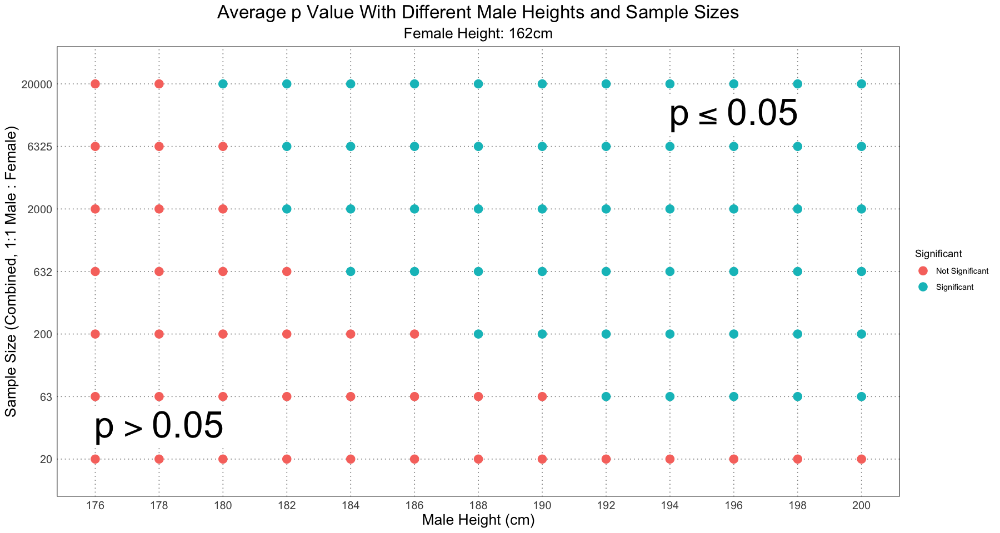

In [142]:
alpha <- 0.05
df$significant <- df$p < alpha
df$sample_size <- factor(df$sample_size)
ggplot(df, aes(male_height, sample_size, colour = significant)) +
    geom_point(size = 4) +
    labs(title = "Average p Value With Different Male Heights and Sample Sizes", x = "Male Height (cm)", y = "Sample Size (Combined, 1:1 Male : Female)", subtitle=paste("Female Height: ", FEMALE_HEIGHT, 'cm', sep = ""), colour = "Significant") +
    annotate('label', label = expression(p <= 0.05), x = 196, y = 6.5, size = unit(14, 'pt'), fill = 'white', label.size = NA) +
    annotate('label', label = expression(p > 0.05), x = 178, y = 1.5, size = unit(14, 'pt'), fill = 'white', label.size = NA) +
    scale_color_discrete(labels = c("Not Significant", "Significant")) +
    scale_x_continuous(breaks = male_heights, labels = male_heights) +
    custom_theme()


This graph is almost identical to Figure 2 in the paper, and from looking at the supplementary information I can confirm that the method was the same. The few discrepancies (notably: I have the samples of size 20 and male height 200cm as not significant, but in Figure 2 it is marked as significant) I am fairly confident I can put down to the fact that I am using fewer Monte Carlo replicates than they did when computing the $p$ value for the dip test. As I was experimenting with different values, I did notice that the values on the fringe of significant / not significant were quite sensitive to choices of the number of replicates, the number of samples, and whether or not to use the Monte Carlo method to compute the $p$ value or use the lookup table. 

Nonetheless, the basic idea remains: even with human height, widely acknowledged as an example of sexual size dimorphism, Hartigans' dip test did not recover it as being dimorphic (see the column where male height was 176cm). For even quite extreme levels of dimorphism, you need an unrealistically large (in terms of fossil specimens) sample size to recover the dimorphism.


Just for interest's sake, let's look at a contour plot of the $p$ values to get a better feel for what's happening there (rather than just significant / not significant).

Warning message in is.na(x):
“is.na() applied to non-(list or vector) of type 'expression'”
Warning message in is.na(x):
“is.na() applied to non-(list or vector) of type 'expression'”


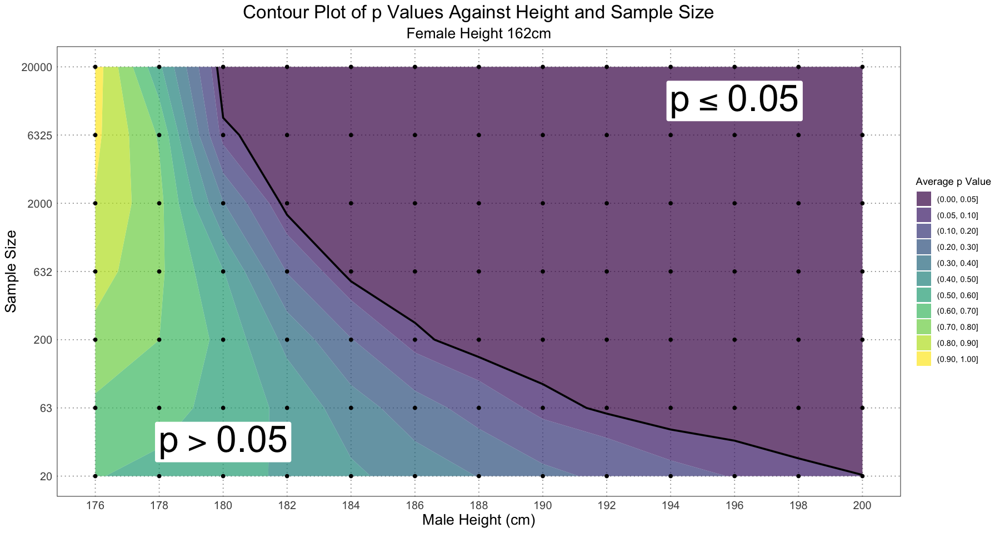

In [203]:
contour_df <- data.frame(male_height = df$male_height, sample_size = as.numeric(df$sample_size), p = df$p, significant = df$significant)
contour_breaks <- c(0, alpha, seq(0.1, 1, by = 0.1))
ggplot(contour_df, aes(male_height, sample_size, z = p)) +
    geom_contour_filled(breaks = contour_breaks, alpha = 0.7) +
    geom_contour(aes(linewidth = after_stat(level == alpha)), breaks = contour_breaks, colour = 'black', show.legend = FALSE) +
    scale_linewidth_manual(values = c(0, 1)) +
    geom_point() +
    labs(title = "Contour Plot of p Values Against Height and Sample Size", subtitle = 'Female Height 162cm', x = "Male Height (cm)", y = "Sample Size", fill = "Average p Value") +
    annotate('label', label = expression(p <= 0.05), x = 196, y = 6.5, size = unit(14, 'pt'), fill = 'white', label.size = NA) +
    annotate('label', label = expression(p > 0.05), x = 180, y = 1.5, size = unit(14, 'pt'), fill = 'white', label.size = NA) +
    scale_y_continuous(labels = levels(df$sample_size), breaks = unique(contour_df$sample_size)) +
    scale_x_continuous(breaks = unique(contour_df$male_height), labels = unique(contour_df$male_height)) +
    custom_theme()

Alternatively, we could focus in on the area where $p \leq 0.05$ (the significant region) to see how those values change:

Warning message in is.na(x):
“is.na() applied to non-(list or vector) of type 'expression'”
Warning message in is.na(x):
“is.na() applied to non-(list or vector) of type 'expression'”


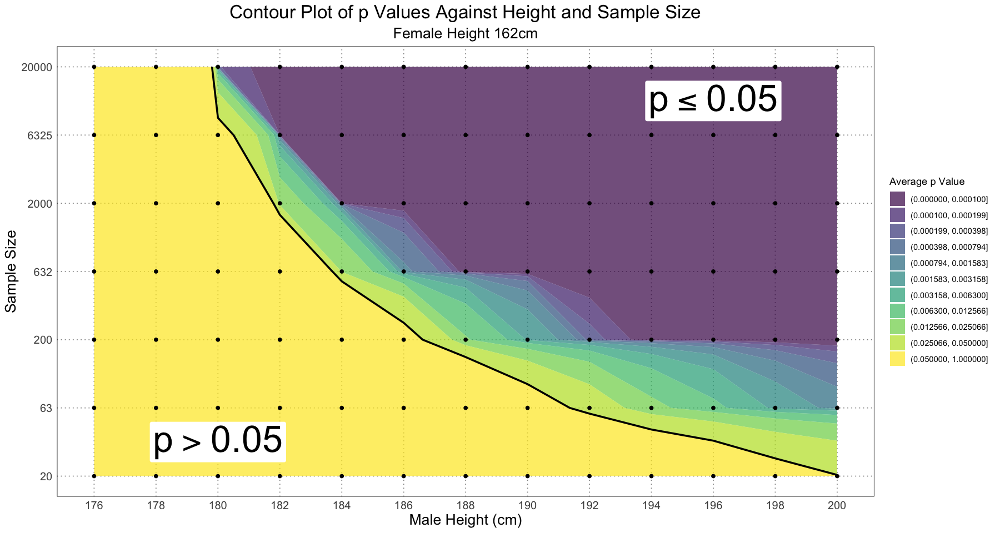

In [205]:

# from close to zero to alpha = 0.05 in 10 equally spaced log steps
p_value_seq <- exp(seq(log(1e-4), log(alpha), length.out = 10))
contour_breaks <- c(0, p_value_seq, 1)
ggplot(contour_df, aes(male_height, sample_size, z = p)) +
    geom_contour_filled(breaks = contour_breaks, alpha = 0.7) +
    geom_contour(aes(linewidth = after_stat(level == alpha)), breaks = contour_breaks, colour = 'black', show.legend = FALSE) +
    scale_linewidth_manual(values = c(0, 1)) +
    geom_point() +
    labs(title = "Contour Plot of p Values Against Height and Sample Size", subtitle = 'Female Height 162cm', x = "Male Height (cm)", y = "Sample Size", fill = "Average p Value") +
    annotate('label', label = expression(p <= 0.05), x = 196, y = 6.5, size = unit(14, 'pt'), fill = 'white', label.size = NA) +
    annotate('label', label = expression(p > 0.05), x = 180, y = 1.5, size = unit(14, 'pt'), fill = 'white', label.size = NA) +
    scale_y_continuous(labels = levels(df$sample_size), breaks = unique(contour_df$sample_size)) +
    scale_x_continuous(breaks = unique(contour_df$male_height), labels = unique(contour_df$male_height)) +
    custom_theme()


The next thing the authors looked at was the effect of changing the ratio of males / females in the sample or changing the standard deviations of the populations. Unsurprisingly, in both cases this had the effect of making dimorphism difficult to detect. In addition, they referenced Mallon (2017)'s use of mixture modelling to test the hypothesis of dimorphism. The basic idea is that he looked at different mixture models and used the Akaike Information Criterion to select the best model; if that was a mixture of two it was taken as evidence for sexual dimorphism. I am going to largely ignore this approach for the pragmatic reason that I believe it is a fruitful area for further research but my understanding of the underlying ideas is not yet good enough to approach it properly.

The next section was largely an overview of the methods and results of Hone & Mallon (2017), where they looked at the difficulty of using $t$ tests to find evidence of dimorphism even in the case where the sex of the subjects is known (using simulated populations of American alligators and rheas). They also looked at the effect of population structure (preponderence of juveniles) and taphonomic bias (lower preservation rate for smaller individuals) and looked at the effect that that had on the ability to detect dimorphism. Essentially, they found that you would need unrealistic sample sizes to have any hope of detecting even lage degrees of dimorphism, even in the even more unrealistic scenario where you knew the sex of each sample. As I have explored this paper in a fair degree of detail elsewhere, I'll leave it at that.

## A New Approach

The main part of the paper is the proposal for a new method of finding and quantifying dimorphism. The main innovation in this method is that they lean in to the problems caused by having individuals of different ages in the sample by using them to construct a growth curve of the taxon in question. This then turns a *disadvantage* into an *advantage*. In the previous methods, having individuals of different ages can lead to greater overlap in the sizes of dimorphic individuals (e.g. a young male might look in size like an order female), whereas with this method having individuals of different sizes can lead to better resolution for the growth curve and thus greater confidence in the computed values. Once you have a growth curve, then if you are looking for evidence of sexual dimorphism the next step is to rule out other sources of variation.

The first thing to check against is non-sexual variation and polymorphism. Once thing to check against is the presence of more than two 'morphs'. For instance, if you see three or more natural groups within the data, it would seem unlikely that sexual variation is the culprit. Another thing to check against is that you are not seeing the result of population-level differences (for instance, if you have two different populations of the same species but which happen to be different sizes, that might look like sexual dimorphism). In order to counter this, you should aim to get the data from a single location and time; the wider the discrepancy in either of these, the less certain you can be that you are not just looking at population-level differences.

Once you have the data, you can examine it for evidence of dimorphism. This could come in the form of a clear separation of points along the regression curve or as a widening of the data. In simulations, alligators (continuous growth) show a clear separation while rheas (deterministic growth) show a widening with no clear separation.

The next step is to assign the sex of each individual. In the absence of other indicators (e.g. medullary bone or other such unambigious indicators), a simple way of doing this is to fit a growth curve to the data as a whole and then assign individuals above the curve to one sex and those below it to another. While this method is easy to understand and computationally easy, it has the major disadvantage of biasing the results in favour of finding sexual dimorphism; that is, a population with a small degree of dimorphism (or even no dimorphism) will show some level of difference using this method. Nonetheless, in realistic situations the accuracy can be surprisingly high.

This seems like the weakest part of the paper to me (which is fair; determining the sex of fossil specimens is a hard problem!). They certainly include different ideas for further research (mixture modelling, k-means clustering, &c.) and it would be very interesting to look more into these approaches. For now we'll just take it as a given that we can use this method and see what the results look like.

Once the sex has been assigned, the next step is to separately fit a growth curve to each of the sexes. This then allows you to estimate the level of dimorphism; in the paper they used the difference in the asymptotic length or mass of each sex. From there, you can compute confidence or prediction intervals, &c. In the paper, they also examined the difference in the maximum of the smaller sex and the minimum of the larger one and also the difference in the maximum of the larger and the minimum of the smaller to see how much spread / variation there is in the characteristic.

To summarize, the steps are:
1. Get data, including age (or a proxy for age) and the feature suspected to be dimorphic
1. Fit a growth curve to the data
1. Assign a sex to each individual; as one method, assign all individuals above the combined growth curve to one sex and those below to the other
1. Fit separate growth curves to each sex
1. Estimate the extent of dimorphism as the difference in the asymptotic sizes of each sex
1. Use the confidence / prediction intervals to determine measures of separation and spread

## Step-By-Step

Let's take a look at what this process looks like by going through this process using simulated American alligator data from Hone & Mallon (2017) (originally from Wilkinson & Rhodes (1997)). Note that this was not explicitly part of the paper, although thanks to the fact that they included their code in the Supplemental Information (*with* comments, for which they should receive some sort of award or recognition) it is easy enough to find.

Recall that the alligator growth data was modelled by a von Bertalanffy curve with different means and standard deviations for each sex. For the purposes of this simulation, we will be considering age (in years) against body length and looking for a sexually dimorphic signal. Of course, since this is a simulation and we know the curve from which the body lengths are generated, we already know the answer.

$$
\begin{align*}
L_m &= 3.79 * (1 - 0.94 e^{-0.0695t}) \\
\sigma_{L_m} &= 0.0589 \log L_m + 0.0816 \\
L_f &= 2.78 * (1 - 0.91 e^{-0.0926t}) \\
\sigma_{L_f} &= 0.0332 \log L_f + 0.046 \\
\end{align*}
$$

Note that the form used here is slightly different from the general form of the von Bertalanffy curve; a simple transformation of the exponential gives us the empirical one

$$
\begin{align*}
C &= L_\infty \left(1 - e^{-K(P-t)}\right) \\
    &= L_\infty \left(1 - e^{Kt} \ast e^{-KP}\right) \\
    &= L_\infty \left(1 - A e^{-KP}\right) \\
\end{align*}
$$

Nothing tricky, but probably best to be explicit. Also note that the $t$ variables in the empirical function corresponds to $P$ in the general one.

Since we're looking for the magnitude of dimorphism, let's also be explicit about that. Since both the male and female alligator lengths are described by curves of the same shape, we have

$$
\begin{align*}
L_M &= L_{M,\infty}\left( 1 - A_M e^{-K_M t}\right) \\
L_F &= L_{F,\infty}\left( 1 - A_F e^{-K_F t}\right) \\
\end{align*}
$$

In general, when we discuss the amount of dimorphism we are looking for the difference in asymptotic length; in this case, $L_{M,\infty} - L_{F,\infty}$ = 3.79 - 2.78 = 1.01. This has an easy interpretation: if we look at very old individuals, we expect the males to be about 1m longer than the females. This is the absolute difference; later when we compare different species we will need some sort of comparison that is not dependent on the actual measurement, but we'll get to that later.

Since we'll be using these a lot, let's write some functions to generate the data.

In [2]:
actual_male_params <- list(
    L = 3.79,
    A = 0.94,
    K = 0.0695
)
actual_female_params <- list(
    L = 2.78,
    A = 0.91,
    K = 0.0926
)
generate_male_alligator_mean_lengths <- function(t) {
    3.79 * (1 - 0.94 * exp(-0.0695 * t))
}

generate_male_alligator_sigma <- function(lengths) {
    0.0589 * log(lengths) + 0.0816
}

generate_female_alligator_mean_lengths <- function(t) {
    2.78 * (1 - 0.91 * exp(-0.0926 * t))
}

generate_female_alligator_sigma <- function(lengths) {
    0.0332 * log(lengths) + 0.046
}

generate_alligator_samples <- function(t, sex) {
    if (sex == "M") {
        length_function <- generate_male_alligator_mean_lengths
        sigma_function <- generate_male_alligator_sigma
    } else if (sex == "F") {
        length_function <- generate_female_alligator_mean_lengths
        sigma_function <- generate_female_alligator_sigma
    }
    lengths <- length_function(t)
    sigmas <- sigma_function(lengths)
    rnorm(length(t), mean = lengths, sd = sigmas)
}

Now that we have the curves, let's generate some samples and see what the distribution looks like.

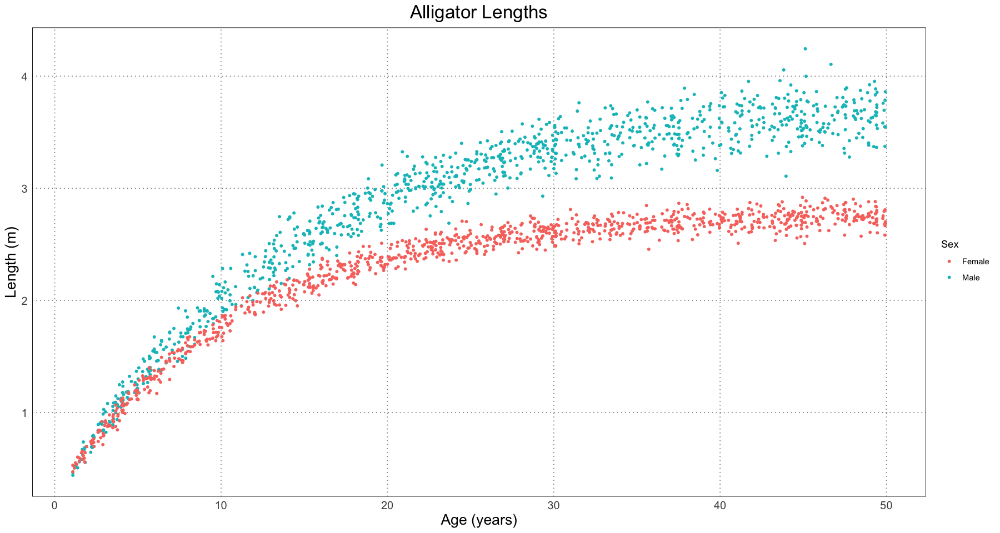

In [3]:
ALLIGATOR_MAX_LIFESPAN <- 50
t <- runif(1000, 1, ALLIGATOR_MAX_LIFESPAN) # start at 1 to avoid problems with the sd (log 0 -> -inf); this was done in the paper as well.
male_sample <- generate_alligator_samples(t, sex = "M")
female_sample <- generate_alligator_samples(t, sex = "F")
combined_sample <- c(male_sample, female_sample)
alligator_df <- data.frame(t = rep(t, 2), length = combined_sample, sex = rep(c("M", "F"), each = length(t)))

alligator_plot <- ggplot(alligator_df, aes(t, length)) +
    geom_point(aes(colour = sex), size = 1) +
    labs(title = "Alligator Lengths", x = "Age (years)", y = "Length (m)", colour = "Sex") +
    scale_colour_discrete(labels = c("Female", "Male")) +
    custom_theme()
print(alligator_plot)

Great! Just by staring at the plot we have some reasonable grounds to suspect that there is some dimorphism. In the spirit of the paper, let's pretend that we have gone through and ruled out other sources of dimorphsim: different populations, locations, times, or other factors.

The next step is to assign a sex to each specimen. To do so, we'll fit a curve to the full sample and check the residuals. In this example, we're pretending that we don't have the sex data (as would be the case if these were fossils) and so are trying to recreate them.

To fit the curve, we'll use the `nls` function to compute the least-squares fit to the data. There is an excellent tutorial on how to do so [here](https://martinlab.chem.umass.edu/r-fitting-data/).

In [4]:
# this is the function we're fitting
generalized_von_bertalanffy <- function(t, L, A, K) {
    # print(paste("L", L))
    # print(paste("A", A))
    # print(paste("K", K))
    L * (1 - A * exp(-K * t))
}

# initial guesses - we'll use the average of the male and female values
initial_parameters <- list(L = mean(c(3.79, 2.78)), A = mean(c(0.94, 0.91)), K = mean(c(0.0695, 0.0926)))

alligator_combined_curve_fit <- nls(length ~ generalized_von_bertalanffy(t, L, A, K), data = alligator_df, start = initial_parameters)
alligator_combined_curve_fit

Nonlinear regression model
  model: length ~ generalized_von_bertalanffy(t, L, A, K)
   data: alligator_df
      L       A       K 
3.27102 0.92375 0.07877 
 residual sum-of-squares: 238.5

Number of iterations to convergence: 2 
Achieved convergence tolerance: 8.637e-07

In [5]:
# here are the best-fit parameters
cc <- coef(alligator_combined_curve_fit)
cc

L         A         K 
3.2710247 0.9237495 0.0787736

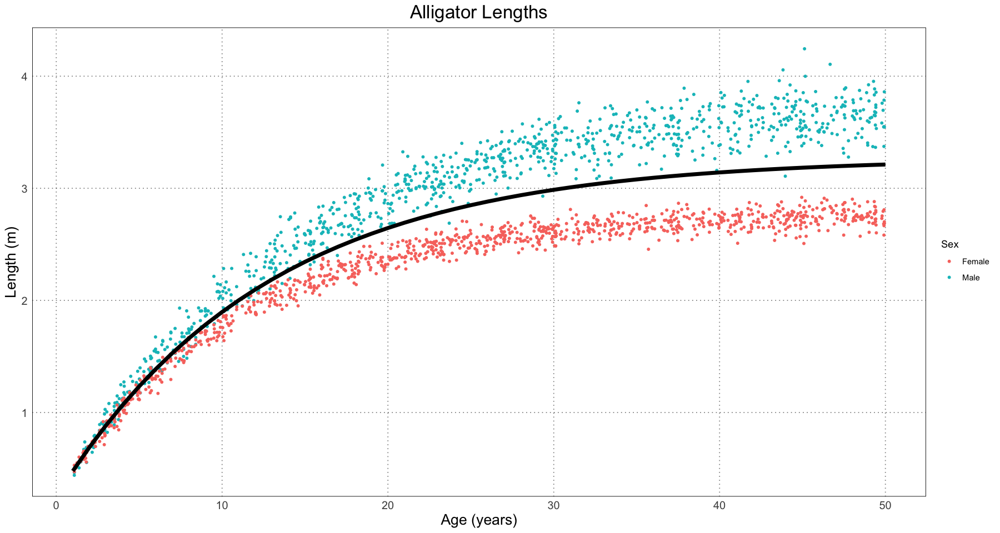

In [6]:
t <- seq(1, ALLIGATOR_MAX_LIFESPAN, by=1)
predicted_lengths <- generalized_von_bertalanffy(t, L = cc[['L']], A = cc[['A']], K = cc['K'])

alligator_plot +
    geom_line(data = data.frame(t = t, length = predicted_lengths), mapping = aes(t, length), linewidth = 2)

In order to predict the sex (remember, we're pretending we don't already know that), we need to look at the residuals as compared to the combined fit model. Luckily, our `nls` object has those pre-computed.

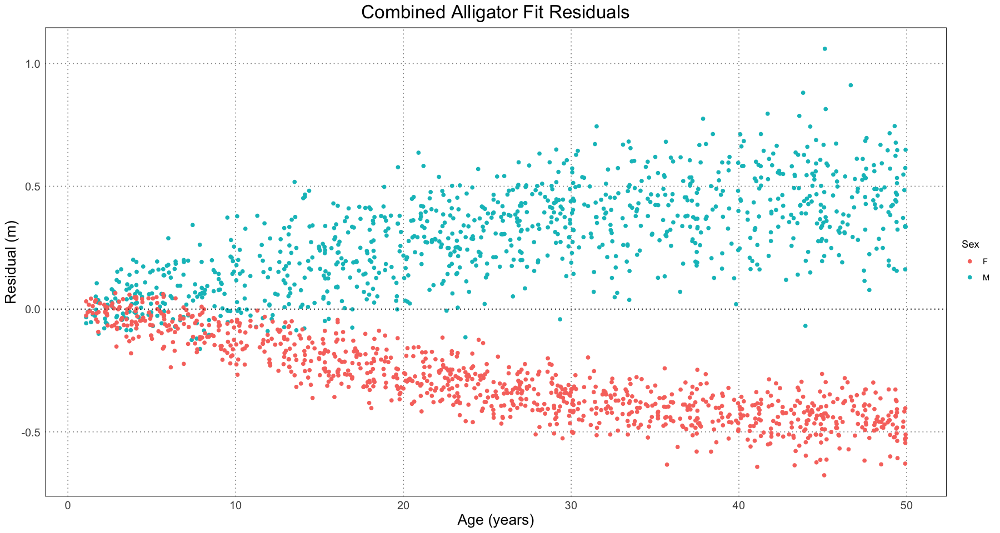

In [7]:
residuals <- residuals(alligator_combined_curve_fit)
plot_df <- data.frame(t = alligator_df$t, residual = residuals, sex = alligator_df$sex)
ggplot(plot_df, aes(t, residual)) +
    geom_point(aes(colour = sex)) +
    geom_hline(yintercept = 0, linetype = 'dotted') +
    custom_theme() +
    labs(title = 'Combined Alligator Fit Residuals', x = 'Age (years)', y = 'Residual (m)', colour = "Sex")


This plot has several features which we could have predicted from the earlier one. First of all, we see that the residuals are close to zero for young alligators and increase over time as the lengths diverge. Secondly, we see that the male alligators almost invariably have a positive residual and female ones have a negative one, again as we predicted.

We can also see from the residuals plot that our model is not a good one - we have clear divergence, among other problems. However, we're not too concerned about that - we know it's not a good model; we're just using this as an initial step to fit a better one (one where the males and females have their own curves).

The next thing we're going to do is to 'predict' the sex of each individual by seeing if its residual is positive or negative. Somewhat arbitrarily, we'll assign positive residuals to being male and negative ones to be being female.

In [8]:
alligator_df$residuals <- residuals(alligator_combined_curve_fit)
alligator_df$predicted_sex <- ifelse(alligator_df$residuals > 0, "M", "F")

Now let's plot the data, highlighting where the predicted sex is incorrect.

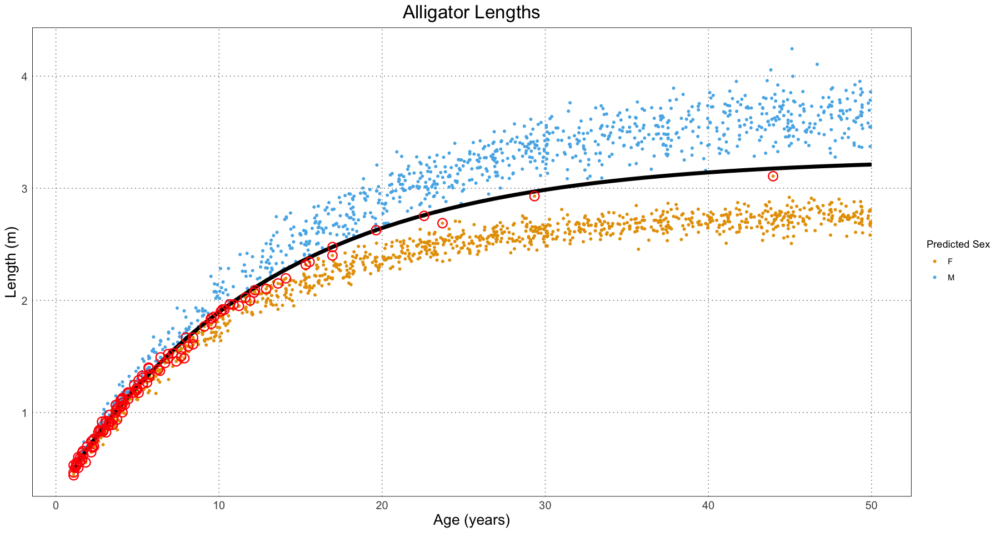

In [9]:
ggplot(alligator_df, aes(t, length)) +
    geom_point(aes(colour = predicted_sex), size = 1) +
    labs(title = "Alligator Lengths", x = "Age (years)", y = "Length (m)", colour = "Predicted Sex") +
    scale_colour_manual(values = c("#E69F00", "#56B4E9"), labels = c("F", "M")) +
    geom_line(data = data.frame(t = t, length = predicted_lengths), mapping = aes(t, length), linewidth = 2) +
    geom_point(data = alligator_df[alligator_df$sex != alligator_df$predicted_sex, ], aes(t, length), pch = 21, fill = NA, colour = "red", stroke = 1, size = 4) +
    custom_theme()

As expected, the classifier is worse for younger alligators (where the sizes are basically the same) and much better for the older ones, where there is a clearer separation.

As the authors themselves note, determination of sex is one of the toughest parts of this whole process and would be a fruitful area for further research. This method has the advantage of being easy to understand and computationally easy. It is also surprisingly accurate.

Warning message:
“Removed 1 row containing missing values (`geom_line()`).”


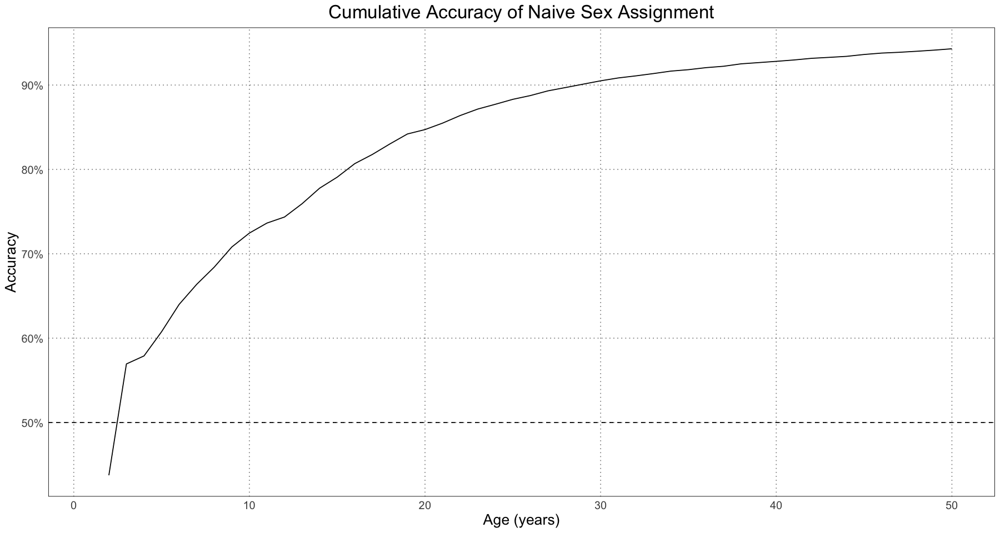

In [10]:
sex_accuracy_df <- data.frame(t = numeric(), accuracy = numeric())
for (threshold_t in 1:ALLIGATOR_MAX_LIFESPAN) {
    relevant <- alligator_df[alligator_df$t <= threshold_t, ]
    accuracy <- sum(relevant$sex == relevant$predicted_sex) / nrow(relevant)
    sex_accuracy_df <- rbind(sex_accuracy_df, data.frame(t = threshold_t, accuracy = accuracy))
}
ggplot(sex_accuracy_df, aes(t, accuracy)) +
    geom_line() +
    geom_hline(yintercept = 0.5, linetype = 'dashed') +
    labs(title = "Cumulative Accuracy of Naive Sex Assignment", x = "Age (years)", y = "Accuracy") +
    scale_y_continuous(labels = scales::percent) +
    custom_theme()

At all ages the naive classifier is better than random (the 50% dashed line) and for the entire population as a whole the accuracy is above 90%, which is pretty good.

The next thing the paper's authors did is look at how the accuracy of the classifier fared over different effect sizes, where here an effect size of 0 means that there is no dimorphism, effect size of 1 means the naturally occurring dimorphism between male and female alligators, and effect size 2 means twice as much dimorphism as is naturally present.

In [11]:
# E is the effect size
generate_simulated_male_alligator_parameters <- function(effect_size) {
    list(
        L = 2.78 + effect_size,
        A = 0.91 + 0.0297 * effect_size,
        K = 0.0926 - 0.02287 * effect_size
    )
}

generate_simulated_male_lengths <- function(t, E) {
    params <- generate_simulated_male_alligator_parameters(E)
    means <- generalized_von_bertalanffy(t, params[['L']], params[['A']], params[['K']])
    # as in the paper, we use the male sd
    rnorm(length(t), mean = means, sd = generate_male_alligator_sigma(means))
}

generate_simulated_female_lengths <- function(t) {
    means <- generate_female_alligator_mean_lengths(t)
    # as in the paper, we use the male sd
    rnorm(length(t), mean = means, sd = generate_male_alligator_sigma(means))
}

accuracy_df <- data.frame(E = numeric(), accuracy = numeric(), sample_size = numeric())
for(sample_size in seq(5, 130, by = 10)) {
    for (E in seq(0, 2, length.out = 10)) {
        t <- runif(sample_size, 1, ALLIGATOR_MAX_LIFESPAN)
        female_sample <- generate_simulated_female_lengths(t)
        male_sample <- generate_simulated_male_lengths(t, E)

        combined_data <- data.frame(t = rep(t, 2), length = c(female_sample, male_sample), sex = rep(c("F", "M"), each = length(t)))

        # start at the female ones - will mean that it takes longer to converge, but that's OK
        initial_parameters <- list(L = 2.78, A = 0.91, K = 0.0926)

        combined_curve_fit <- nls(length ~ generalized_von_bertalanffy(t, L, A, K), data = combined_data, start = initial_parameters)
        cc <- coef(combined_curve_fit)
        combined_data$residuals <- residuals(combined_curve_fit)
        combined_data$predicted_sex <- ifelse(combined_data$residuals > 0, "M", "F")
        accuracy <- sum(combined_data$sex == combined_data$predicted_sex) / nrow(combined_data)
        # since sample_size is for each of male and females, the total sample size is twice that
        accuracy_df <- rbind(accuracy_df, data.frame(E = E, accuracy = accuracy, sample_size = sample_size * 2))
    }
}
head(accuracy_df)

,E,accuracy,sample_size
,<dbl>,<dbl>,<dbl>
1,0.0000000,0.7,10
2,0.2222222,0.4,10
3,0.4444444,0.9,10
4,0.6666667,1.0,10
5,0.8888889,1.0,10
6,1.1111111,1.0,10


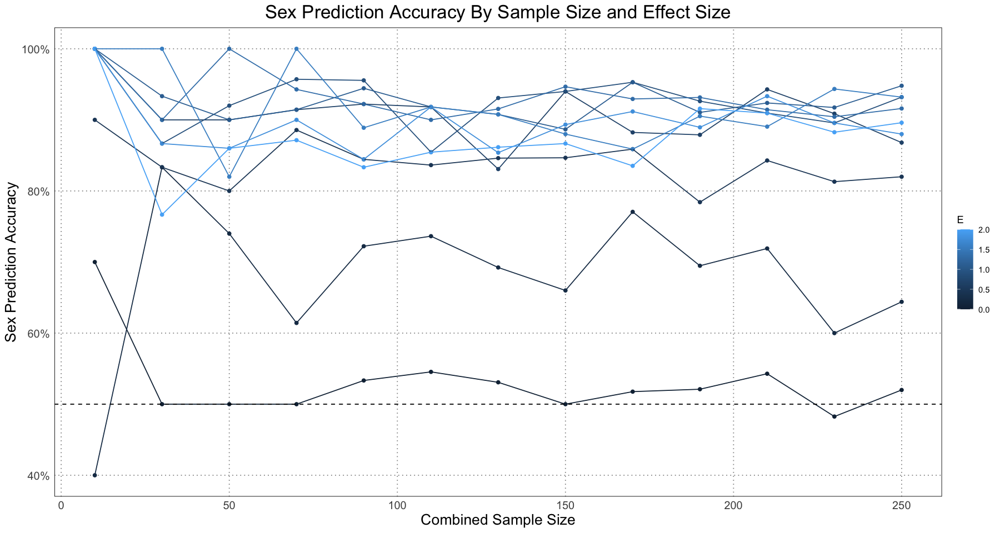

In [12]:
ggplot(accuracy_df, aes(sample_size, accuracy, colour = E, group = E)) +
    geom_point() +
    geom_line() +
    geom_hline(yintercept = 0.5, linetype = 'dashed') +
    labs(x = 'Combined Sample Size', y = 'Sex Prediction Accuracy', title = 'Sex Prediction Accuracy By Sample Size and Effect Size') +
    scale_y_continuous(labels = scales::percent) +
    custom_theme()

Since this is a graph of a single run for each sample size and effect size there is a fair amount of variation. However, the pattern is clear - as long as there is some amount of dimorphism, the accuracy for even small sample sizes can be quite good.

This graph is based on Figure 7 in Saitta, et. al. (2020), but I have not broken the accuracy up by sex but rather looked at the combined accuracy instead. Nonetheless, the results are essentially the same.

Since there is so much variation caused by just having a single run, let's repeat this a number of times for each effect size and sample size and plot the results using a contour plot to get a better idea for what's happening.

In [13]:
NUM_REPETITIONS <- 100
repeated_accuracy_df <- data.frame(E = numeric(), accuracy = numeric(), sample_size = numeric())
# for (sample_size in c(5)) {
for(sample_size in seq(5, 130, by = 10)) {
    for (E in seq(0, 2, by = 0.1)) {
        sum_accuracies <- 0
        for (rep_number in 1:NUM_REPETITIONS) {
            t <- runif(sample_size, 1, ALLIGATOR_MAX_LIFESPAN)
            female_sample <- generate_simulated_female_lengths(t)
            male_sample <- generate_simulated_male_lengths(t, E)

            combined_data <- data.frame(t = rep(t, 2), length = c(female_sample, male_sample), sex = rep(c("F", "M"), each = length(t)))

            # start at the mean of the parameters
            male_params <- generate_simulated_male_alligator_parameters(E)
            initial_parameters <- list(L = mean(c(2.78, male_params[['L']])), A = mean(c(0.91, male_params[['A']])), K = mean(c(0.0926, male_params[['K']])))

            tryCatch({
                # set tol = 100 to avoid problems with low effect size and samples -> the data are too sparse to set a good approximation of the growth curve. We're OK with that.
                combined_curve_fit <- nls(length ~ generalized_von_bertalanffy(t, L, A, K), data = combined_data, start = initial_parameters, control = list(tol = 100))
            }, error = function(cond){
                message(paste("Error fitting data"))
                message(conditionMessage(cond))
                message(paste('sample_size', sample_size))
                message(paste('effect size', E))
                message(paste('rep number', rep_number))
                next
            })
            cc <- coef(combined_curve_fit)
            combined_data$residuals <- residuals(combined_curve_fit)
            combined_data$predicted_sex <- ifelse(combined_data$residuals > 0, "M", "F")
            accuracy <- sum(combined_data$sex == combined_data$predicted_sex) / nrow(combined_data)
            sum_accuracies <- sum_accuracies + accuracy
        }
        # since sample_size is for each of male and females, the total sample size is twice that
        repeated_accuracy_df <- rbind(repeated_accuracy_df, data.frame(E = E, accuracy = sum_accuracies / NUM_REPETITIONS, sample_size = sample_size * 2))
    }
}
head(repeated_accuracy_df)
# repeated_accuracy_df

,E,accuracy,sample_size
,<dbl>,<dbl>,<dbl>
1,0.0,0.536,10
2,0.1,0.620,10
3,0.2,0.685,10
4,0.3,0.753,10
5,0.4,0.820,10
6,0.5,0.852,10


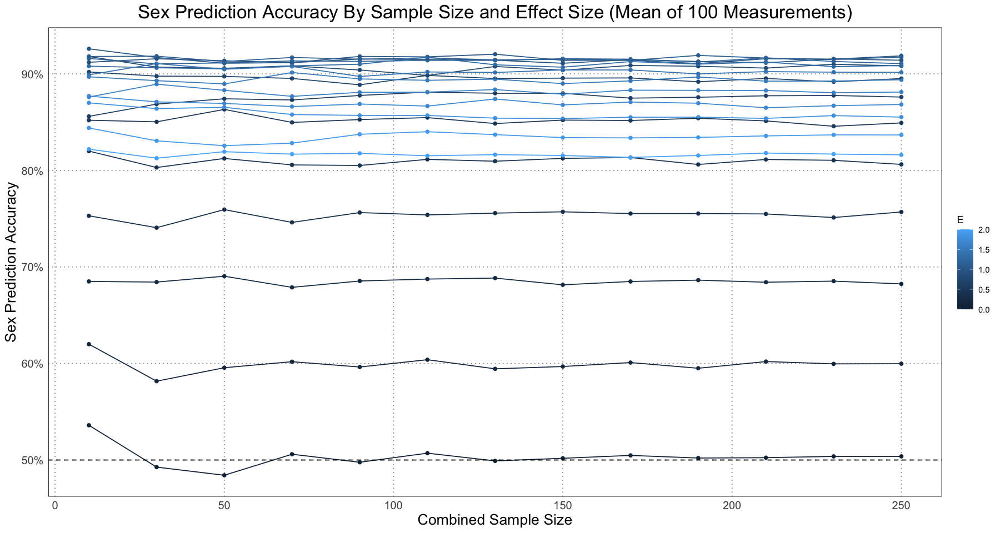

In [14]:
ggplot(repeated_accuracy_df, aes(sample_size, accuracy, group = E, colour = E)) +
    geom_point() +
    geom_line() +
    geom_hline(yintercept = 0.5, linetype = 'dashed') +
    labs(x = 'Combined Sample Size', y = 'Sex Prediction Accuracy', title = 'Sex Prediction Accuracy By Sample Size and Effect Size (Mean of 100 Measurements)') +
    scale_y_continuous(labels = scales::percent) +
    custom_theme()

As we expect, if there is no effect size then the naive classifier is right about 50% of the time (if there's no difference, then we are basically guessing - there's no difference to go on!). As the effect size increases, so does our accuracy.

Of course, all of this analysis was done with a sex ratio of 1:1 - we always had the same number of male and female samples! In reality, this might not be the case. The authors go on to demonstrate that the accuracy of the naive classifier is harmed by the presence of ratios different from 1 - that is, if there is a skew in the sex ratio then the accuracy suffers. I'm going to skip recreating that analysis.


Although the general pattern is that the accuracy increases, if you look closely at the graph you can notice that actually for large values of the effect size, the accuracy seems to *decrease*. By looking at the values for a specific value of the sample size, we can see this more clearly.

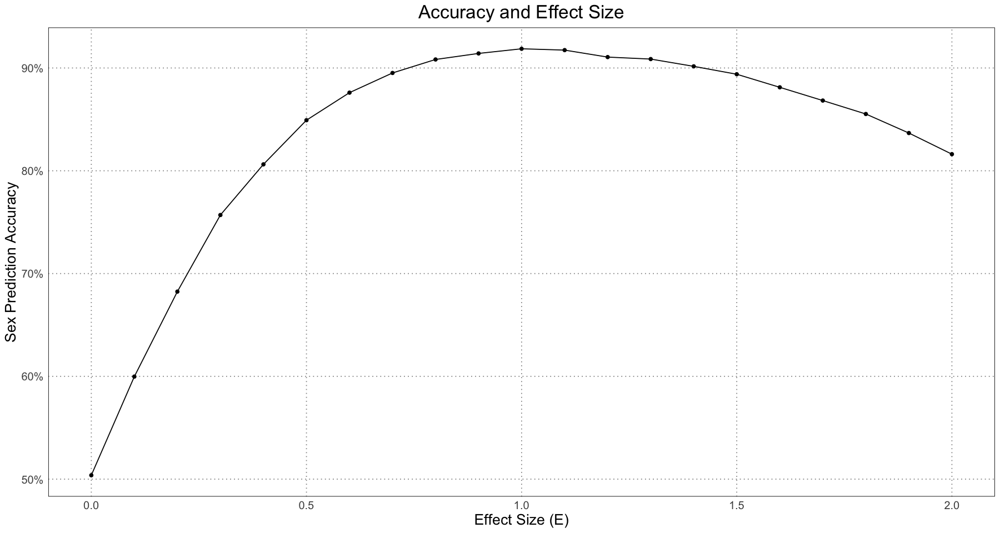

In [15]:
ggplot(repeated_accuracy_df[repeated_accuracy_df$sample_size == 250, ], aes(E, accuracy)) +
    geom_point() +
    geom_line() +
    scale_y_continuous(labels = scales::percent) +
    labs(title = "Accuracy and Effect Size", x = "Effect Size (E)", y = "Sex Prediction Accuracy") +
    custom_theme()

In order to see what's going on, let's take a look at a few plots for the different effect sizes.

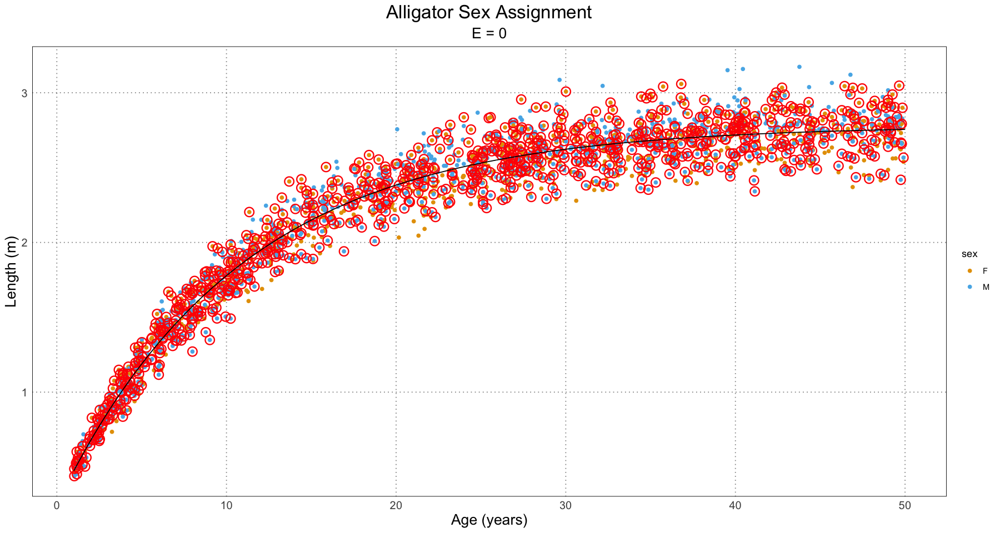

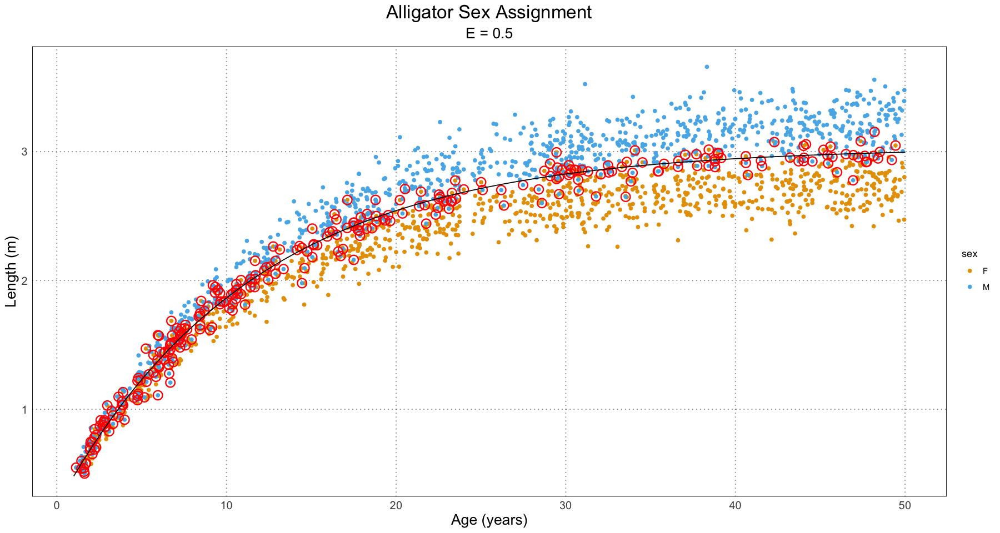

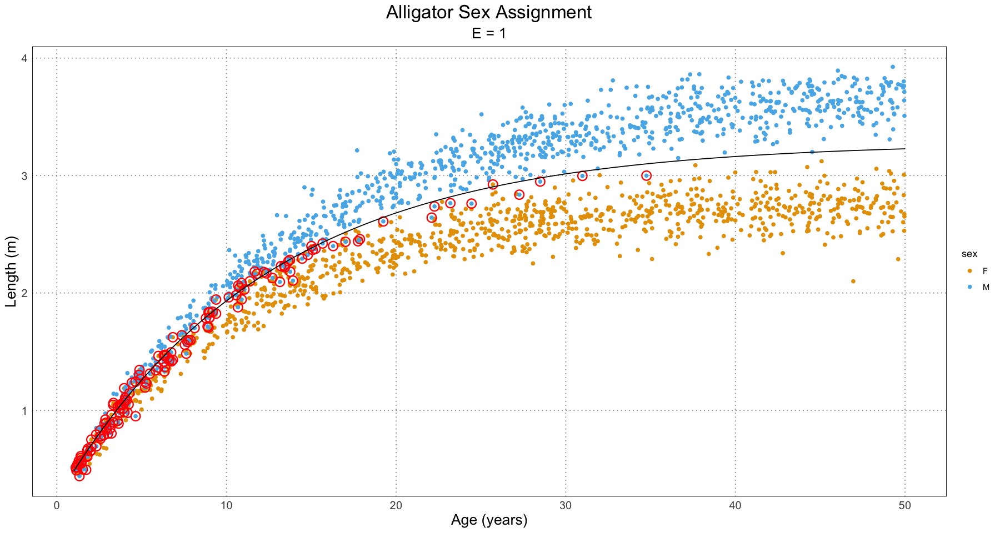

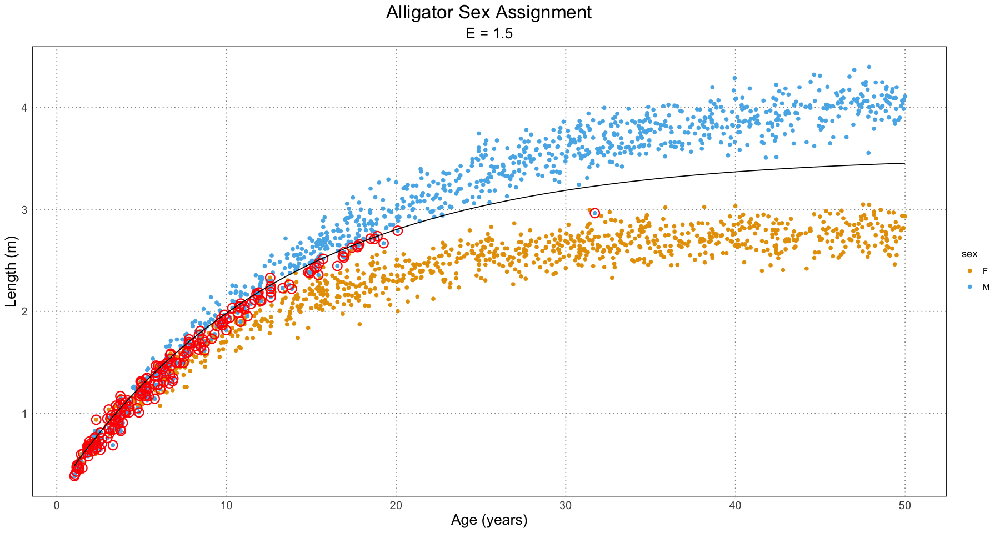

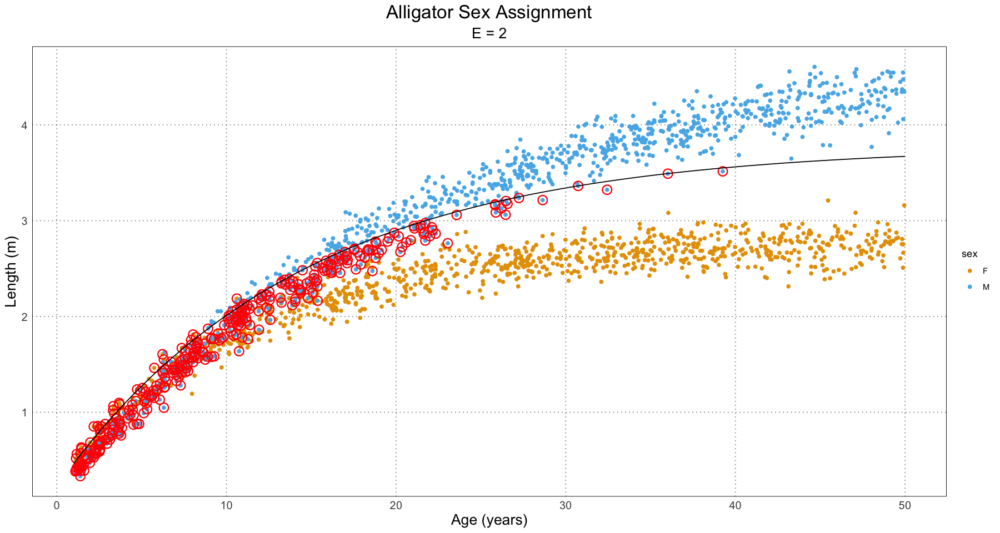

In [16]:
sample_size <- 1e3
for (E in seq(0, 2, by = 0.5)) {
    t <- runif(sample_size, 1, ALLIGATOR_MAX_LIFESPAN)
    female_sample <- generate_simulated_female_lengths(t)
    male_sample <- generate_simulated_male_lengths(t, E)

    combined_data <- data.frame(t = rep(t, 2), length = c(female_sample, male_sample), sex = rep(c("F", "M"), each = length(t)), E = E)

    # start at the mean of the parameters
    male_params <- generate_simulated_male_alligator_parameters(E)
    initial_parameters <- list(L = mean(c(2.78, male_params[['L']])), A = mean(c(0.91, male_params[['A']])), K = mean(c(0.0926, male_params[['K']])))
    
    tryCatch({
        # set tol = 100 to avoid problems with low effect size and samples -> the data are too sparse to set a good approximation of the growth curve. We're OK with that.
        combined_curve_fit <- nls(length ~ generalized_von_bertalanffy(t, L, A, K), data = combined_data, start = initial_parameters, control = list(tol = 100))
    }, error = function(cond){
        message(paste("Error fitting data"))
        message(conditionMessage(cond))
        message(paste('sample_size', sample_size))
        message(paste('effect size', E))
        message(paste('rep number', rep_number))
        next
    })
    cc <- coef(combined_curve_fit)
    combined_data$residuals <- residuals(combined_curve_fit)
    combined_data$predicted_sex <- ifelse(combined_data$residuals > 0, "M", "F")
    
    # curve data - graph the computed combined growth curve
    curve_t <- seq(1, ALLIGATOR_MAX_LIFESPAN, length.out = 1e3)
    curve_length <- generalized_von_bertalanffy(curve_t, L = cc[['L']], A = cc[['A']], K = cc[['K']])
    curve_df <- data.frame(t = curve_t, length = curve_length, E = E)

    p <- ggplot(combined_data, aes(t, length)) +
        geom_point(aes(colour = sex)) +
        scale_colour_manual(values = c("#E69F00", "#56B4E9"), labels = c("F", "M")) +
        geom_point(data = combined_data[combined_data$sex != combined_data$predicted_sex, ], aes(t, length), pch = 21, fill = NA, colour = "red", stroke = 1, size = 4) +
        geom_line(data = curve_df, aes(t, length)) +
        labs(title = "Alligator Sex Assignment", subtitle = paste("E =", E), x = "Age (years)", y = "Length (m)") +
        custom_theme()
    print(p)
}


From this, we can have a good guess at the problem - our initial guess as to the combined growth curve is becoming so bad that it is misclassifying many of the younger individuals. We have a fit problem! For now, this is not something I'm concerned about. A fruitful area for further research would be to fit a different family of curve to the population as a whole as compared to the male and female populations. For instance, we could fit some sort of polynomial (truncated Taylor series) to the curve (selected on some sort of information criterion).

Bottom line: this naive classifier, while it certaily has some faults, works surprisingly well. As the authors admit, methods to more accurately predict sex will be key to further advancement in this.

The next thing we're going to do is to fit curves individually to the male and female (predicted, not actual) individuals. Once we have these parameters, we will be able to give a numeric estimate of the difference in the different sexes! Let's start by fitting the curve to the actual alligator sizes.

In [249]:

generate_curve_fit <- function(df, debug = FALSE) {
    # print("In generate_curve_fit")
    # print(df)
    initial_params_raw <- tryCatch({vbStarts(df$length ~ df$t)},
        error = function(e) {
            if (debug) {
                cat("Error in getting initial params in generate_curve_fit", conditionMessage(e))
            }
            NULL
        }
    )

    if (is.null(initial_params_raw)) return(NULL)

    # now convert to my parameterization
    # I use y = Linf * (1 - A e ^ (-Kt) )
    # they use y = Linf * (1 - e^(-K (t - t0)))
    # -> A = e^K t0
    initial_params <- list(
        L = initial_params_raw$Linf,
        K = initial_params_raw$K,
        A = exp(initial_params_raw$K * initial_params_raw$t0)
    )
    fit <- tryCatch({ nlsLM(length ~ generalized_von_bertalanffy(t, L, A, K), data = df, start = initial_params) }, error = function(e) {
            cat("Error in generate_curve_fit", conditionMessage(e))
            print(df)
            NULL
        }
    )
    fit
}

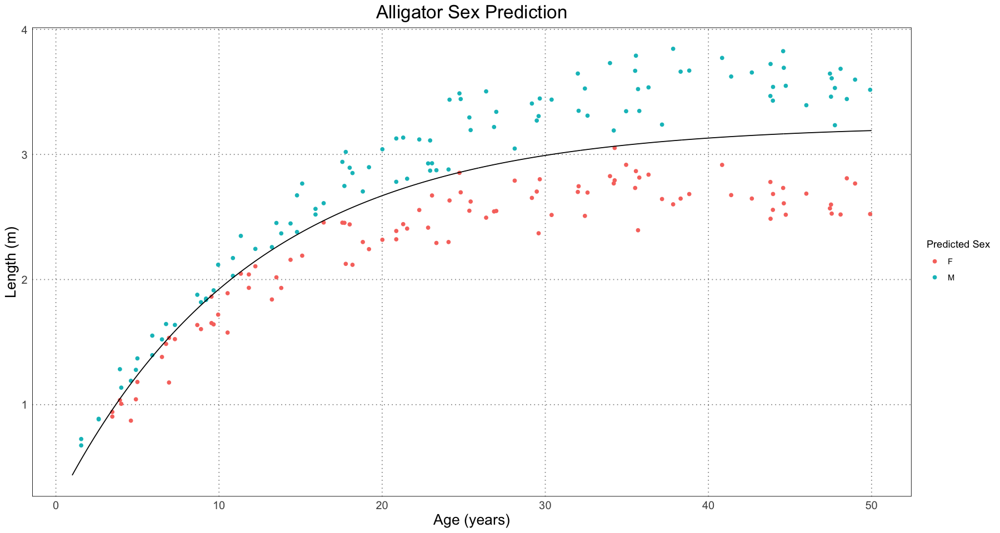

In [210]:
E <- 1 # use the naturally occurring effect size
t <- runif(1e2, 1, ALLIGATOR_MAX_LIFESPAN)
female_sample <- generate_simulated_female_lengths(t)
male_sample <- generate_simulated_male_lengths(t, E)

combined_data <- data.frame(t = rep(t, 2), length = c(female_sample, male_sample), sex = rep(c("F", "M"), each = length(t)), E = E)

# start at the mean of the parameters
male_params <- generate_simulated_male_alligator_parameters(E)
initial_parameters <- list(L = mean(c(2.78, male_params[['L']])), A = mean(c(0.91, male_params[['A']])), K = mean(c(0.0926, male_params[['K']])))

combined_curve_fit <- generate_curve_fit(combined_data)
cc <- coef(combined_curve_fit)
combined_data$residuals <- residuals(combined_curve_fit)
combined_data$predicted_sex <- ifelse(combined_data$residuals > 0, "M", "F")

# curve data - graph the computed combined growth curve
curve_t <- seq(1, ALLIGATOR_MAX_LIFESPAN, length.out = 1e3)
curve_length <- generalized_von_bertalanffy(curve_t, L = cc[['L']], A = cc[['A']], K = cc[['K']])
curve_df <- data.frame(t = curve_t, length = curve_length, E = E)

ggplot(combined_data, aes(t, length)) +
    geom_point(aes(colour = predicted_sex)) +
    geom_line(data = curve_df, mapping = aes(t, length)) +
    labs(x = "Age (years)", y = "Length (m)", title = "Alligator Sex Prediction", colour = "Predicted Sex") +
    custom_theme()

Now do the same for each of the male and female samples (again, based on the predicted sex).

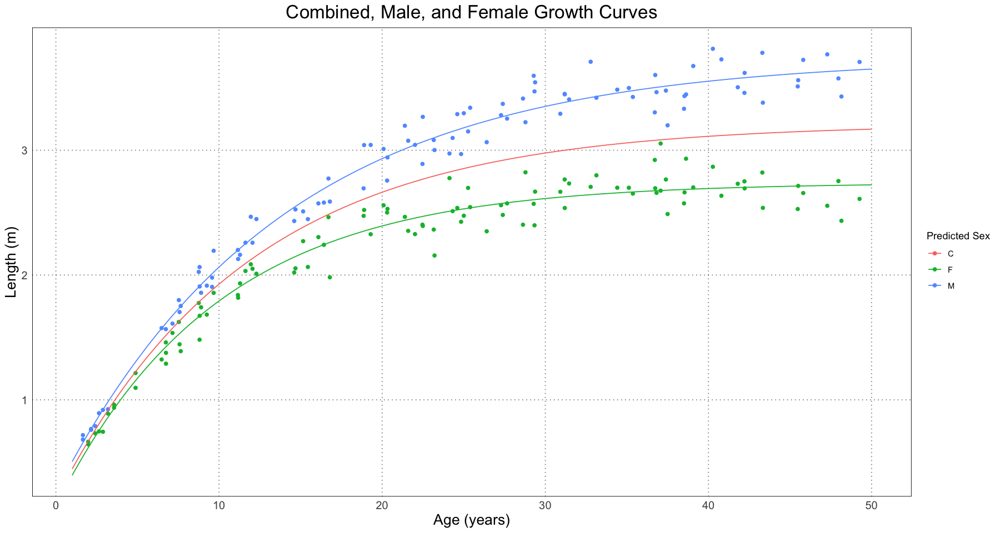

In [104]:
female_data <- combined_data[combined_data$predicted_sex == "F", ]
female_fit <- generate_curve_fit(female_data)
female_params <- coef(female_fit)
female_curve <- generalized_von_bertalanffy(curve_t, L = female_params[['L']], A = female_params[['A']], K = female_params[['K']])

male_data <- combined_data[combined_data$predicted_sex == 'M', ]

male_fit <- generate_curve_fit(male_data)
male_params <- coef(male_fit)
male_curve <- generalized_von_bertalanffy(curve_t, L = male_params[['L']], A = male_params[['A']], K = male_params[['K']])

curve_fit_df <- curve_df
curve_fit_df$sex <- "C" # combined
female_df <- data.frame(t = curve_t, length = female_curve, sex = "F", E = E)
male_df <- data.frame(t = curve_t, length = male_curve, sex = "M", E = E)
curve_fit_df <- rbind(curve_fit_df, male_df, female_df)

ggplot(combined_data, aes(t, length)) +
    geom_point(aes(colour = predicted_sex)) +
    geom_line(data = curve_fit_df, mapping = aes(t, length, colour = sex)) +
    labs(x = "Age (years)", y = "Length (m)", title = "Combined, Male, and Female Growth Curves", colour = "Predicted Sex") +
    custom_theme()

From this, it seems like the curves are generally doing a good job of modelling the different growth trajectories of the male and female alligators. Let's take a look at the actual parameters recovered.

In [105]:
print(male_params)
print(actual_male_params)

         L          K          A 
3.74061366 0.07302061 0.93048356 
$L
[1] 3.79

$A
[1] 0.94

$K
[1] 0.0695



In [106]:
print(female_params)
print(actual_female_params)

        L         K         A 
2.7395458 0.1006420 0.9460577 
$L
[1] 2.78

$A
[1] 0.91

$K
[1] 0.0926



It looks like this method is recovering the original parameters! Of course, we should look at the fit objects to look at the confidence interval as well.

In [107]:
print(actual_male_params)
confint(male_fit)

$L
[1] 3.79

$A
[1] 0.94

$K
[1] 0.0695



Waiting for profiling to be done...



,2.5%,97.5%
L,3.66723694,3.82160532
K,0.06713261,0.07910325
A,0.89997332,0.96239258


In [108]:
print(actual_female_params)
confint(female_fit)

$L
[1] 2.78

$A
[1] 0.91

$K
[1] 0.0926



Waiting for profiling to be done...



,2.5%,97.5%
L,2.68885696,2.7947638
K,0.09043163,0.1114972
A,0.89433685,1.0014973


In addition to just eyeballing it, we can also verify that the male and female parameters are within the confidence intervals. Success!

Of course, we can also add these intervals to the graph. In the paper, they included both the *confidence intervals* and the *prediction intervals* for the different curve. The confidence interval is an interval constructed such that some percent of the time (95%, in our case) the interval would contain the population value; the prediction interval is the interval such that we are, for instance, 95% certain that other observations will fall. The [Wikipedia article](https://en.wikipedia.org/w/index.php?title=Prediction_interval&oldid=1197729094) has a good way of explaining it. When rolling a six-sided dice, the *confidence interval* for the rolls will become a narrow band around 3.5 (the mean), while the *prediction interval* will contain the range 1-6.

In [109]:
alpha_level <- 0.05
curve_t <- seq(1, ALLIGATOR_MAX_LIFESPAN, by = 1)
prediction_df <- data.frame(t = curve_t)

In [110]:
female_ci_prediction <- predictNLS(female_fit, prediction_df, level = 1 - alpha_level, interval = "confidence")
female_ci_prediction

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #2...

predictNLS: Propagating predictor value #3...

predictNLS: Propagating predictor value #4...

predictNLS: Propagating predictor value #5...

predictNLS: Propagating predictor value #6...

predictNLS: Propagating predictor value #7...

predictNLS: Propagating predictor value #8...

predictNLS: Propagating predictor value #9...

predictNLS: Propagating predictor value #10...

predictNLS: Propagating predictor value #11...

predictNLS: Propagating predictor value #12...

predictNLS: Propagating predictor value #13...

predictNLS: Propagating predictor value #14...

predictNLS: Propagating predictor value #15...

predictNLS: Propagating predictor value #16...

predictNLS: Propagating predictor value #17...

predictNLS: Propagating predictor value #18...

predictNLS: Propagating predictor value #19...

predictNLS: Propagating predictor value #20...

predictNLS: Propagating predictor value #21...

p

$summary
   Prop.Mean.1 Prop.Mean.2   Prop.sd.1   Prop.sd.2 Prop.2.5% Prop.97.5%
1    0.3959217   0.3957148 0.070028658 0.070029650 0.2567607  0.5346688
2    0.6203079   0.6201208 0.062897559 0.062898462 0.4953166  0.7449250
3    0.8232106   0.8230415 0.056450649 0.056451471 0.7110295  0.9350534
4    1.0066868   1.0065338 0.050622609 0.050623359 0.9060861  1.1069816
5    1.1725964   1.1724581 0.045354405 0.045355089 1.0824637  1.2624524
6    1.3226213   1.3224962 0.040592687 0.040593312 1.2419502  1.4030421
7    1.4582822   1.4581691 0.036289258 0.036289830 1.3861622  1.5301760
8    1.5809546   1.5808523 0.032400585 0.032401109 1.5165615  1.6451431
9    1.6918819   1.6917894 0.028887364 0.028887844 1.6344696  1.7491091
10   1.7921887   1.7921050 0.025714132 0.025714573 1.7410817  1.8431283
11   1.8828917   1.8828161 0.022848915 0.022849321 1.8374781  1.9281541
12   1.9649106   1.9648422 0.020262919 0.020263293 1.9246354  2.0050490
13   2.0390767   2.0390148 0.017930255 0.017930601 2.00

In [111]:
male_ci_prediction <- predictNLS(male_fit, prediction_df, alpha = alpha_level)
male_ci_prediction

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #2...

predictNLS: Propagating predictor value #3...

predictNLS: Propagating predictor value #4...

predictNLS: Propagating predictor value #5...

predictNLS: Propagating predictor value #6...

predictNLS: Propagating predictor value #7...

predictNLS: Propagating predictor value #8...

predictNLS: Propagating predictor value #9...

predictNLS: Propagating predictor value #10...

predictNLS: Propagating predictor value #11...

predictNLS: Propagating predictor value #12...

predictNLS: Propagating predictor value #13...

predictNLS: Propagating predictor value #14...

predictNLS: Propagating predictor value #15...

predictNLS: Propagating predictor value #16...

predictNLS: Propagating predictor value #17...

predictNLS: Propagating predictor value #18...

predictNLS: Propagating predictor value #19...

predictNLS: Propagating predictor value #20...

predictNLS: Propagating predictor value #21...

p

$summary
   Prop.Mean.1 Prop.Mean.2   Prop.sd.1   Prop.sd.2 Prop.2.5% Prop.97.5%
1    0.5051308   0.5050055 0.059433006 0.059433500 0.3870151  0.6229959
2    0.7329681   0.7328516 0.055075425 0.055075886 0.6235122  0.8421911
3    0.9447614   0.9446532 0.051025001 0.051025431 0.8433549  1.0459515
4    1.1416407   1.1415401 0.047260132 0.047260533 1.0477161  1.2353641
5    1.3246560   1.3245625 0.043760738 0.043761112 1.2376857  1.4114393
6    1.4947837   1.4946968 0.040508157 0.040508506 1.4142772  1.5751163
7    1.6529313   1.6528505 0.037485043 0.037485369 1.5784326  1.7272684
8    1.7999424   1.7998673 0.034675276 0.034675581 1.7310276  1.8687070
9    1.9366013   1.9365314 0.032063875 0.032064160 1.8728760  2.0001868
10   2.0636368   2.0635719 0.029636920 0.029637186 2.0047346  2.1224091
11   2.1817267   2.1816664 0.027381473 0.027381722 2.1273068  2.2360260
12   2.2915009   2.2914448 0.025285516 0.025285749 2.2412463  2.3416434
13   2.3935450   2.3934929 0.023337882 0.023338101 2.34

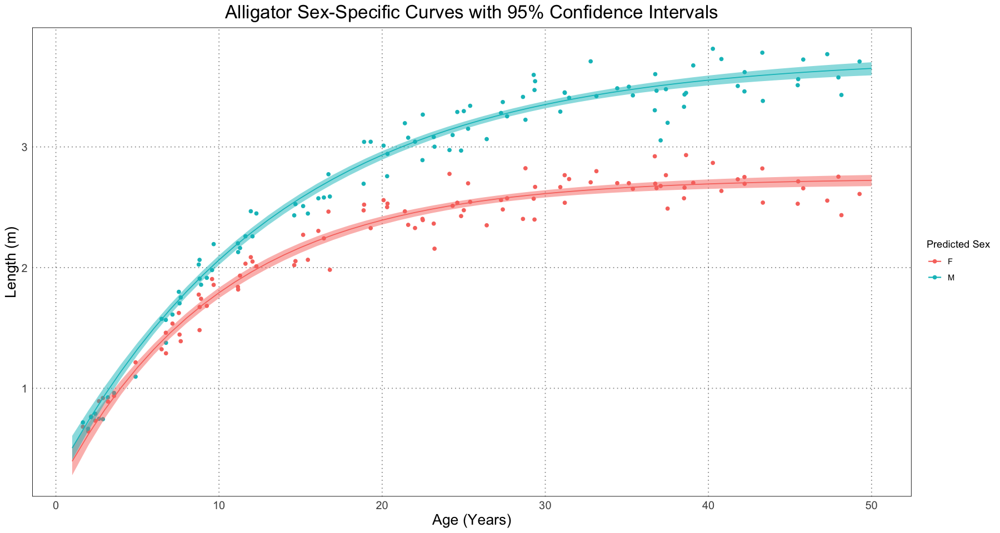

In [112]:
# NB The figure uses the simulated confidence intervals, not the propagated ones
female_ci_prediction_df <- data.frame(t = curve_t, length = female_ci_prediction$summary$Prop.Mean.2, lower = female_ci_prediction$summary$`Sim.2.5%`, upper = female_ci_prediction$summary$`Sim.97.5%`)
male_ci_prediction_df <- data.frame(t = curve_t, length = male_ci_prediction$summary$Prop.Mean.2, lower = male_ci_prediction$summary$`Sim.2.5%`, upper = male_ci_prediction$summary$`Sim.97.5%`)
ggplot() +
    geom_point(data = combined_data, aes(t, length, colour = sex)) +
    geom_line(data = female_ci_prediction_df, aes(t, length, colour = "F")) +
    geom_ribbon(data = female_ci_prediction_df, aes(t, length, ymin = lower, ymax = upper, fill = "F"), alpha = 0.5) +
    geom_line(data = male_ci_prediction_df, aes(t, length, colour = "M")) +
    geom_ribbon(data = male_ci_prediction_df, aes(t, length, ymin = lower, ymax = upper, fill = "M"), alpha = 0.5) +
    labs(title = "Alligator Sex-Specific Curves with 95% Confidence Intervals", x = "Age (Years)", y = "Length (m)", colour = "Predicted Sex") +
    guides(fill = "none") +
    custom_theme()

Just as in the original paper, we can also look at the prediction interval.

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #2...

predictNLS: Propagating predictor value #3...

predictNLS: Propagating predictor value #4...

predictNLS: Propagating predictor value #5...

predictNLS: Propagating predictor value #6...

predictNLS: Propagating predictor value #7...

predictNLS: Propagating predictor value #8...

predictNLS: Propagating predictor value #9...

predictNLS: Propagating predictor value #10...

predictNLS: Propagating predictor value #11...

predictNLS: Propagating predictor value #12...

predictNLS: Propagating predictor value #13...

predictNLS: Propagating predictor value #14...

predictNLS: Propagating predictor value #15...

predictNLS: Propagating predictor value #16...

predictNLS: Propagating predictor value #17...

predictNLS: Propagating predictor value #18...

predictNLS: Propagating predictor value #19...

predictNLS: Propagating predictor value #20...

predictNLS: Propagating predictor value #21...

p

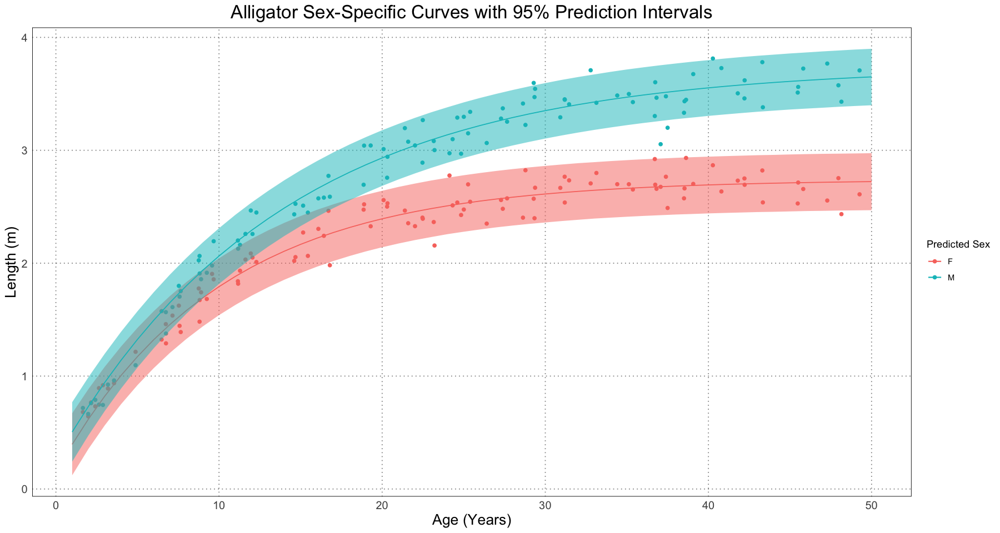

In [113]:
female_pi_prediction <- predictNLS(female_fit, prediction_df, level = 1 - alpha_level, interval = "prediction")
male_pi_prediction <- predictNLS(male_fit, prediction_df, level = 1 - alpha_level, interval = "prediction")
female_pi_prediction_df <- data.frame(t = curve_t, length = female_pi_prediction$summary$Prop.Mean.2, lower = female_pi_prediction$summary$`Sim.2.5%`, upper = female_pi_prediction$summary$`Sim.97.5%`)
male_pi_prediction_df <- data.frame(t = curve_t, length = male_pi_prediction$summary$Prop.Mean.2, lower = male_pi_prediction$summary$`Sim.2.5%`, upper = male_pi_prediction$summary$`Sim.97.5%`)
ggplot() +
    geom_point(data = combined_data, aes(t, length, colour = sex)) +
    geom_line(data = female_pi_prediction_df, aes(t, length, colour = "F")) +
    geom_ribbon(data = female_pi_prediction_df, aes(t, length, ymin = lower, ymax = upper, fill = "F"), alpha = 0.5) +
    geom_line(data = male_pi_prediction_df, aes(t, length, colour = "M")) +
    geom_ribbon(data = male_pi_prediction_df, aes(t, length, ymin = lower, ymax = upper, fill = "M"), alpha = 0.5) +
    labs(title = "Alligator Sex-Specific Curves with 95% Prediction Intervals", x = "Age (Years)", y = "Length (m)", colour = "Predicted Sex") +
    guides(fill = "none") +
    custom_theme()

As expected, these intervals are larger than the confidence intervals. This is because they are really displaying very different information. The confidence interval is some measure of where we expect the true value of the curve to be, whereas the prediction interval is a measure of where we expect new data to be.

Once we have both of these, then we can plot both of the intervals together (as in Figure 6 in the original paper).

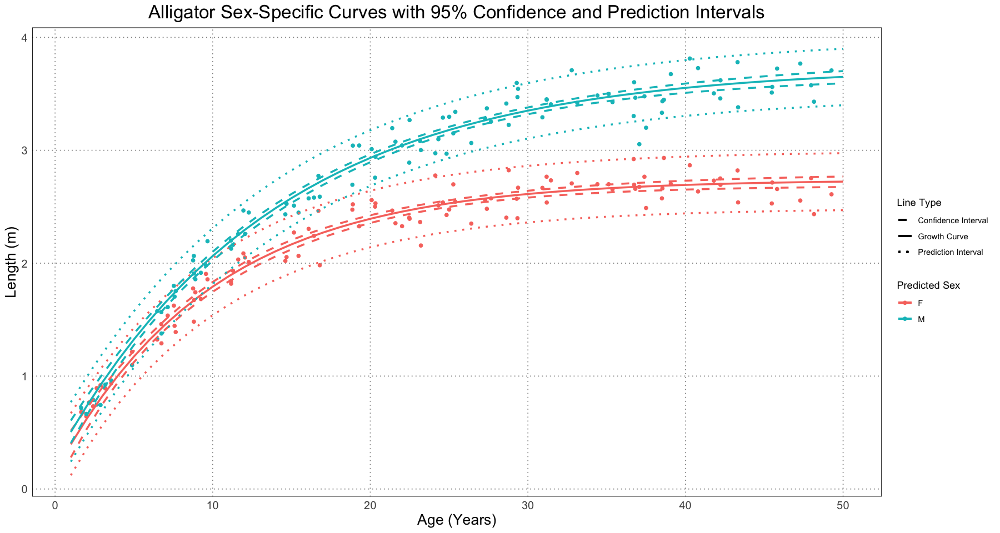

In [114]:
p <- ggplot() +
    # original data
    geom_point(data = combined_data, aes(t, length, colour = sex)) +
    # female curve
    geom_line(data = female_ci_prediction_df, aes(t, length, colour = "F", linetype = "Growth Curve"), linewidth = 1) +
    # female confidence intervals
    geom_line(data = female_ci_prediction_df, aes(t, lower, colour = 'F', linetype = 'Confidence Interval'), linewidth = 1) +
    geom_line(data = female_ci_prediction_df, aes(t, upper, colour = 'F', linetype = "Confidence Interval"), linewidth = 1) +
    # female prediction intervals
    geom_line(data = female_pi_prediction_df, aes(t, lower, colour = 'F', linetype = "Prediction Interval"), linewidth = 1) +
    geom_line(data = female_pi_prediction_df, aes(t, upper, colour = 'F', linetype = "Prediction Interval"), linewidth = 1) +
    # male curve
    geom_line(data = male_ci_prediction_df, aes(t, length, colour = "M", linetype = "Growth Curve"), linewidth = 1) +
    # male confidence intervals
    geom_line(data = male_ci_prediction_df, aes(t, lower, colour = 'M', linetype = "Confidence Interval"), linewidth = 1) +
    geom_line(data = male_ci_prediction_df, aes(t, upper, colour = 'M', linetype = "Confidence Interval"), linewidth = 1) +
    # male prediction intervals
    geom_line(data = male_pi_prediction_df, aes(t, lower, colour = 'M', linetype = "Prediction Interval"), linewidth = 1) +
    geom_line(data = male_pi_prediction_df, aes(t, upper, colour = 'M', linetype = "Prediction Interval"), linewidth = 1) +
    scale_linetype_manual(values = c("Growth Curve" = 'solid', "Confidence Interval" = 'dashed', "Prediction Interval" = 'dotted')) +
    labs(title = "Alligator Sex-Specific Curves with 95% Confidence and Prediction Intervals", x = "Age (Years)", y = "Length (m)", colour = "Predicted Sex", linetype = "Line Type") +
    custom_theme()
print(p)

The authors then looked at two ways to quantify the differences in the two curves:
1. Separation: the difference between the *upper bound* of the *smaller* sex and the *lower bound* of the *larger* sex
1. Spread: the difference between the *lower bound* of the *smaller* sex and the *upper bound* of the *larger* sex

Either of these can be computed using either the confidence or prediction interval. An illustration is shown below.

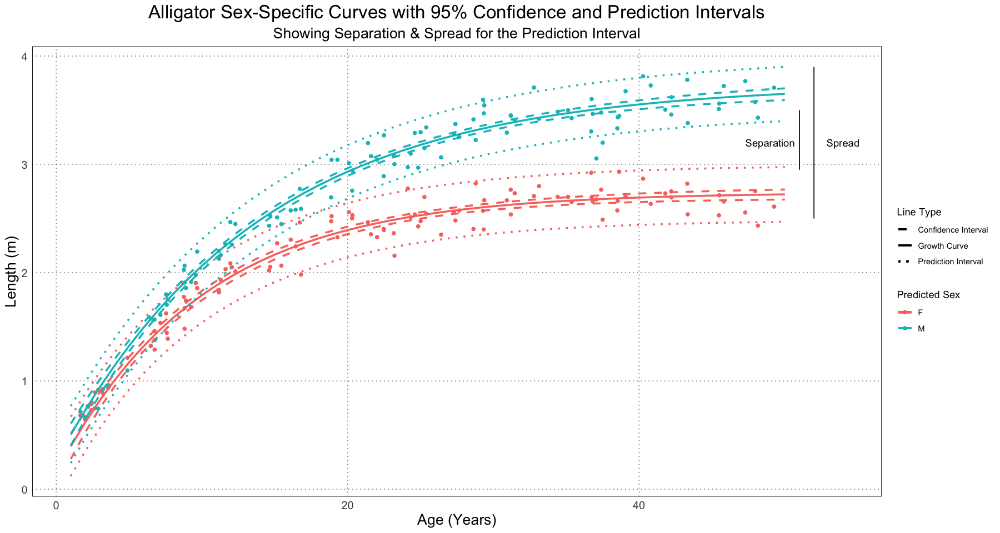

In [115]:
p + 
    geom_segment(aes(x = 51, y = 2.95, xend = 51, yend = 3.5)) +
    annotate('text', x = 49, y = 3.2, label = "Separation") +
    geom_segment(aes(x = 52, y = 2.5, xend = 52, yend = 3.9)) +
    annotate('text', x = 54, y = 3.2, label = "Spread") +
    labs(subtitle = "Showing Separation & Spread for the Prediction Interval")


The authors chose to examine this value at the oldest individual of each predicted sex, but did note that that choice was not the only one that could have been made. For instance, they could have compared the values at the age of the oldest individual of any sex or at some other chosen point; as long there is some basis for using that value and it is held constant, there are many choices that could have been made.

For this particular simulation run, let's calculate the values for the spread and separation using both the confidence and prediction intervals.

In [156]:
# NB Here we are using the propagated rather than simulated values. From their figure 6 it looks like they used the *simulated* values, but their code indicates that they are using the *propagated* values. I am not sure when / why the switch happened.
predicted_female <- combined_data[combined_data$predicted_sex == 'F', ]
max_female_age <- max(predicted_female$t)

fit <- predictNLS(female_fit, data.frame(t = max_female_age), interval = "prediction")
female_lower_prediction <- fit$summary[1, ]$`Prop.2.5%`
female_upper_prediction <- fit$summary[1, ]$`Prop.97.5%`

fit <- predictNLS(female_fit, data.frame(t = max_female_age), interval = "confidence")
female_lower_confidence <- fit$summary[1, ]$`Prop.2.5%`
female_upper_confidence <- fit$summary[1, ]$`Prop.97.5%`

predicted_male <- combined_data[combined_data$predicted_sex == 'M', ]
max_male_age <- max(predicted_male$t)

fit <- predictNLS(male_fit, data.frame(t = max_male_age), interval = "prediction")
male_lower_prediction <- fit$summary[1, ]$`Prop.2.5%`
male_upper_prediction <- fit$summary[1, ]$`Prop.97.5%`

fit <- predictNLS(male_fit, data.frame(t = max_male_age), interval = "confidence")
male_lower_confidence <- fit$summary[1, ]$`Prop.2.5%`
male_upper_confidence <- fit$summary[1, ]$`Prop.97.5%`

confidence_spread <- male_upper_confidence - female_lower_confidence
confidence_separation <- male_lower_confidence - female_upper_confidence
prediction_spread <- male_upper_prediction - female_lower_prediction
prediction_separation <- male_lower_prediction - female_upper_prediction

spread_and_separation <- list(
    confidence_spread=confidence_spread,
    confidence_separation=confidence_separation,
    prediction_spread=prediction_spread,
    prediction_separation=prediction_separation
)
spread_and_separation

predictNLS: Propagating predictor value #1...



predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...



$confidence_spread
[1] 0.9386166

$confidence_separation
[1] 0.9116684

$prediction_spread
[1] 1.417562

$prediction_separation
[1] 0.4327231

What about the effect over different effect sizes?

In [250]:
generate_separation_and_spread <- function(combined_data) {
    predicted_female <- combined_data[combined_data$predicted_sex == 'F', ]
    predicted_male <- combined_data[combined_data$predicted_sex == 'M', ]

    # generate the male and female curves
    female_fit <- generate_curve_fit(predicted_female)
    male_fit <- generate_curve_fit(predicted_male)

    # female parameters
    max_female_age <- max(predicted_female$t)

    fit <- predictNLS(female_fit, data.frame(t = max_female_age), interval = "prediction")
    female_lower_prediction <- fit$summary[1, ]$`Prop.2.5%`
    female_upper_prediction <- fit$summary[1, ]$`Prop.97.5%`

    fit <- predictNLS(female_fit, data.frame(t = max_female_age), interval = "confidence")
    female_lower_confidence <- fit$summary[1, ]$`Prop.2.5%`
    female_upper_confidence <- fit$summary[1, ]$`Prop.97.5%`

    # male parameters
    max_male_age <- max(predicted_male$t)

    fit <- predictNLS(male_fit, data.frame(t = max_male_age), interval = "prediction")
    male_lower_prediction <- fit$summary[1, ]$`Prop.2.5%`
    male_upper_prediction <- fit$summary[1, ]$`Prop.97.5%`

    fit <- predictNLS(male_fit, data.frame(t = max_male_age), interval = "confidence")
    male_lower_confidence <- fit$summary[1, ]$`Prop.2.5%`
    male_upper_confidence <- fit$summary[1, ]$`Prop.97.5%`

    # calculate spread and separation
    confidence_spread <- male_upper_confidence - female_lower_confidence
    confidence_separation <- male_lower_confidence - female_upper_confidence
    prediction_spread <- male_upper_prediction - female_lower_prediction
    prediction_separation <- male_lower_prediction - female_upper_prediction

    spread_and_separation <- list(
        confidence_spread=confidence_spread,
        confidence_separation=confidence_separation,
        prediction_spread=prediction_spread,
        prediction_separation=prediction_separation
    )
    spread_and_separation
}

In [164]:
separation_and_spread_data <- data.frame(
    sample_size = numeric(),
    E = numeric(),
    confidence_separation = numeric(),
    confidence_spread = numeric(),
    prediction_separation = numeric(),
    prediction_spread = numeric()
)

for (E in seq(0, 2, by = 0.1)) {
    for (individual_sample_size in seq(20, 120, by = 20)) {
        t <- runif(individual_sample_size, 1, ALLIGATOR_MAX_LIFESPAN)
        female_sample <- generate_simulated_female_lengths(t)
        male_sample <- generate_simulated_male_lengths(t, E)
        combined_data <- data.frame(
            t = rep(t, 2),
            length = c(female_sample, male_sample),
            sex = rep(c("F", "M"), each = length(t))
        )

        combined_fit <- generate_curve_fit(combined_data)

        # now predict the sex
        combined_data$residuals <- residuals(combined_fit)
        combined_data$predicted_sex <- ifelse(combined_data$residuals < 0, "F", "M")
        
        # generate the separation and spread
        separation_and_spread <- generate_separation_and_spread(combined_data)

        separation_and_spread_data <- rbind(separation_and_spread_data,
            data.frame(sample_size = 2 * individual_sample_size,
            E = E,
            confidence_separation = separation_and_spread[['confidence_separation']],
            confidence_spread = separation_and_spread[['confidence_spread']],
            prediction_separation = separation_and_spread[['prediction_separation']],
            prediction_spread = separation_and_spread[['prediction_spread']]
            )
        )
    }
}
# separation_and_spread_data

predictNLS: Propagating predictor value #1...



predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #1...

predictNLS: P

sample_size,E,confidence_separation,confidence_spread,prediction_separation,prediction_spread
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
40,0.0,0.1360820,0.1770585,-0.172454769,0.4855953
80,0.0,0.1790056,0.2122477,-0.096256220,0.4875095
120,0.0,0.2255297,0.2481250,-0.031194601,0.5048493
160,0.0,0.1994248,0.2294326,-0.098373263,0.5272306
200,0.0,0.2251746,0.2476834,-0.075724584,0.5485825
240,0.0,0.2285246,0.2493011,-0.111382764,0.5892085
40,0.1,0.1932505,0.2363171,-0.131395056,0.5609626
80,0.1,0.2154168,0.2655616,-0.105482920,0.5864613
120,0.1,0.2479805,0.2776692,-0.077233356,0.6028831


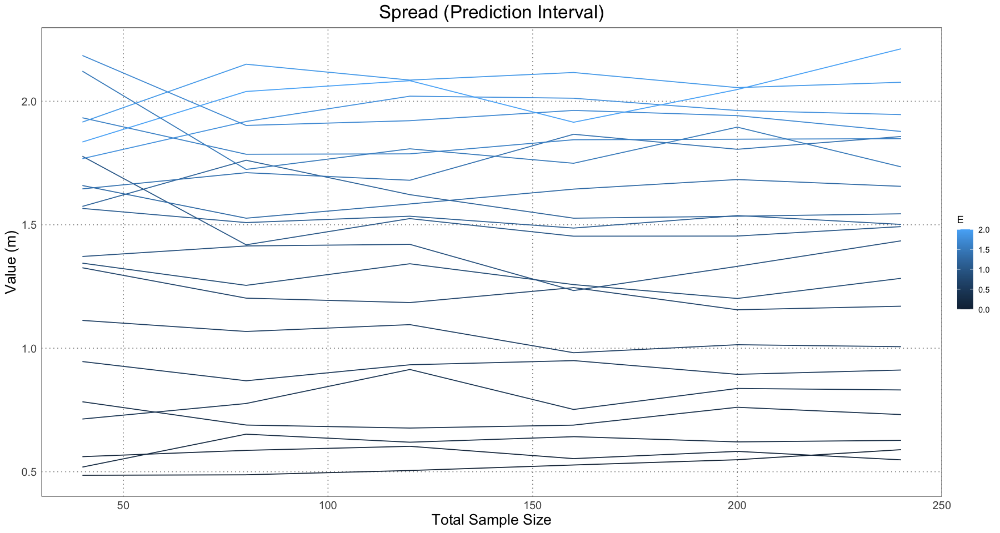

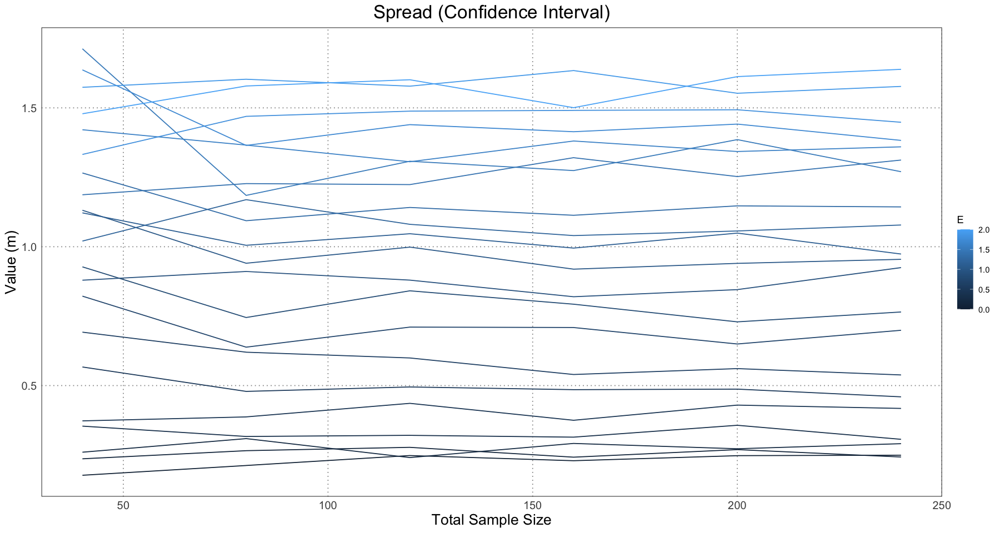

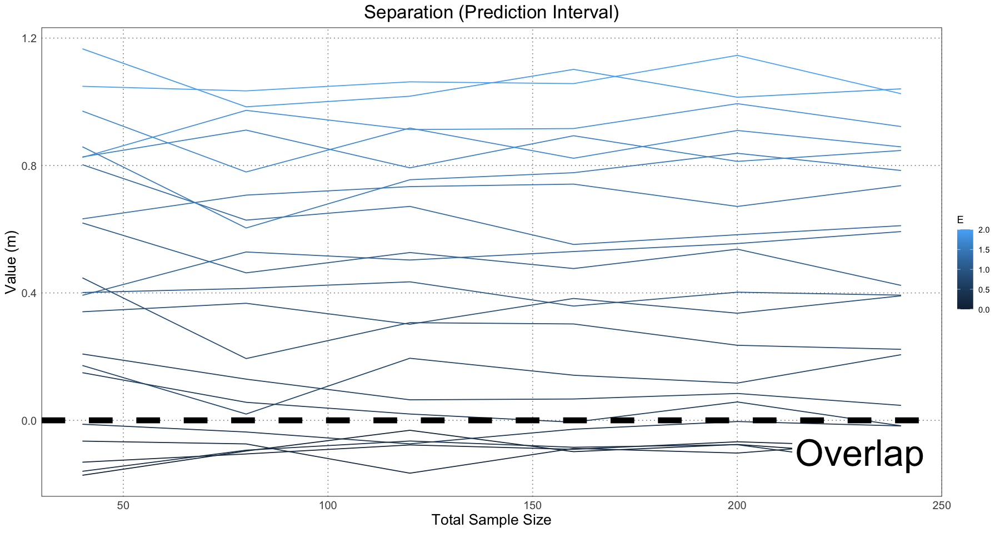

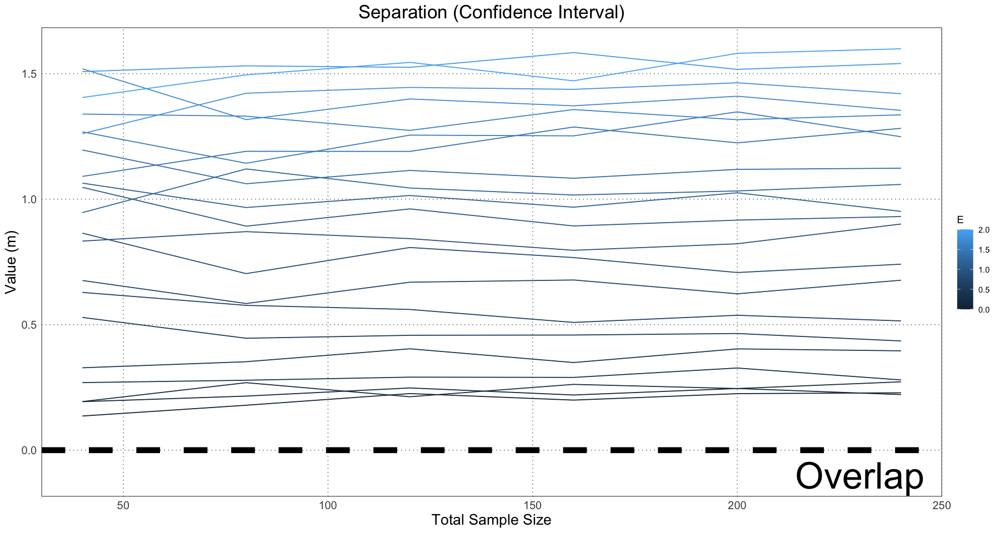

In [217]:
separation_and_spread_data <- separation_and_spread_data[abs(separation_and_spread_data$confidence_separation) < 10, ]
ggplot(separation_and_spread_data, aes(sample_size, prediction_spread, colour = E, group = E)) +
    geom_line() +
    labs(title = "Spread (Prediction Interval)") +
    labs(x = "Total Sample Size", y = "Value (m)") +
    custom_theme()

ggplot(separation_and_spread_data, aes(sample_size, confidence_spread, colour = E, group = E)) +
    geom_line() +
    labs(title = "Spread (Confidence Interval)") +
    labs(x = "Total Sample Size", y = "Value (m)") +
    custom_theme()

ggplot(separation_and_spread_data, aes(sample_size, prediction_separation, colour = E, group = E)) +
    geom_line() +
    geom_hline(aes(yintercept = 0), linetype = 'dashed', linewidth = 3) +
    annotate('label', label = "Overlap", x = 230, y = -0.1, size = unit(14, 'pt'), fill = 'white', label.size = NA) +
    labs(title = "Separation (Prediction Interval)") +
    labs(x = "Total Sample Size", y = "Value (m)") +
    custom_theme()

ggplot(separation_and_spread_data, aes(sample_size, confidence_separation, colour = E, group = E)) +
    geom_line() +
    geom_hline(aes(yintercept = 0), linetype = 'dashed', linewidth = 3) +
    annotate('label', label = "Overlap", x = 230, y = -0.1, size = unit(14, 'pt'), fill = 'white', label.size = NA) +
    labs(title = "Separation (Confidence Interval)") +
    labs(x = "Total Sample Size", y = "Value (m)") +
    custom_theme()

This is essentially what we see in Figure 10 in the original paper.

Of course, we would also like to know whether we can calculate the effect size! For our purposes, we are going to look specifically at the $L$ parameter.

In [235]:
calculate_effect_size <- function(combined_data) {
    predicted_female <- combined_data[combined_data$predicted_sex == 'F', ]
    predicted_male <- combined_data[combined_data$predicted_sex == 'M', ]

    # generate the male and female curves
    female_fit <- generate_curve_fit(predicted_female)
    male_fit <- generate_curve_fit(predicted_male)
    if (is.null(female_fit) || is.null(female_fit)) {
        return(NULL)
    }

    female_linf <- coef(female_fit)[['L']]
    male_linf <- coef(male_fit)[['L']]

    estimated_E <- male_linf - female_linf
    estimated_E
}

In [252]:
effect_size_df <- data.frame(
    sample_size = numeric(),
    E = numeric(),
    estimated_E = numeric()
)
for (E in seq(0, 2, by = 0.1)) {
    for (individual_sample_size in seq(10, 120, by = 20)) {
        t <- runif(individual_sample_size, 1, ALLIGATOR_MAX_LIFESPAN)
        female_sample <- generate_simulated_female_lengths(t)
        male_sample <- generate_simulated_male_lengths(t, E)
        combined_data <- data.frame(
            t = rep(t, 2),
            length = c(female_sample, male_sample),
            sex = rep(c("F", "M"), each = length(t))
        )
        combined_fit <- NULL
        attempts <- 0
        MAX_ATTEMPTS <- 1e3
        while (is.null(combined_fit) || attempts < MAX_ATTEMPTS) {
            combined_fit <- generate_curve_fit(combined_data)
            attempts <- attempts + 1
        }
        # print(coef(combined_fit)[['L']])

        # now predict the sex
        combined_data$residuals <- residuals(combined_fit)
        combined_data$predicted_sex <- ifelse(combined_data$residuals < 0, "F", "M")
        
        estimated_E <- calculate_effect_size(combined_data)
        if (is.null(estimated_E)) {
            next
        }
        effect_size_df <- rbind(
            effect_size_df,
            data.frame(sample_size = 2 * individual_sample_size, E = E, estimated_E = estimated_E)
        )
    }
}
head(effect_size_df)

Error in generate_curve_fit singular gradient matrix at initial parameter estimates           t    length sex   residuals predicted_sex
1   3.156738 0.9347539   F -0.02270952             F
3  18.365387 2.2779380   F -0.08993099             F
4  33.731925 2.5194787   F -0.19697691             F
5  24.593302 2.2429754   F -0.32593065             F
6  49.535312 2.6417028   F -0.16033133             F
7  32.179604 2.6216834   F -0.07760398             F
10 39.902716 2.4834131   F -0.28144983             F
11  3.156738 0.9345472   M -0.02291621             F
13 18.365387 2.3363054   M -0.03156357             F
16 49.535312 2.5681465   M -0.23388764             F
Error in generate_curve_fit singular gradient matrix at initial parameter estimates           t   length sex   residuals predicted_sex
2  33.842479 2.810687   F 0.093100207             M
8  42.824437 2.797586   F 0.017808523             M
9   6.699463 1.481698   F 0.002928069             M
12 33.842479 2.832674   M 0.115086765      

Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”
Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”
Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”
Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”
Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”
Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.


Error in generate_curve_fit singular gradient matrix at initial parameter estimates           t    length sex  residuals predicted_sex
2  37.273978 2.4491080   F -0.7163973             F
3  23.861983 2.4994955   F -0.3542565             F
4  49.873232 2.7017297   F -0.5681302             F
5  26.676912 2.5550019   F -0.3938566             F
7  30.858954 2.5382671   F -0.5180612             F
8  38.639059 2.7158423   F -0.4665802             F
9  34.009034 2.7673356   F -0.3494852             F
10 17.256328 2.3299140   F -0.1971499             F
11  3.835075 0.8525265   M -0.1593556             F


Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”
Warning message:
“Starting value for Linf is very different from the observed maximum
length, which suggests a model fitting problem. See a Walford or
Chapman plot to examine the problem. Consider either using the mean
length for several of the largest fish (i.e., use 'oldAge' in 
'methLinf=') or manually setting Linf in the starting value list
to the maximum observed length.
”
Warning message:
“Starting value for Linf is very different from the observed maximum
length, which suggests a model fitting problem. See a Walford or
Chapman plot to examine the problem. Consider either using the mean
length for several of the largest fish (i.e., use 'oldAge' in 
'methLinf=') or manually setting Linf in the starting value list
to the maximum observed length.
”
Warning message:
“Starting value for Linf is very different from the ob

,sample_size,E,estimated_E
,<dbl>,<dbl>,<dbl>
1,20,0,0.06807891
2,60,0,0.26545547
3,100,0,0.26352243
4,140,0,0.14935715
5,180,0,0.26731096
6,220,0,0.24967666


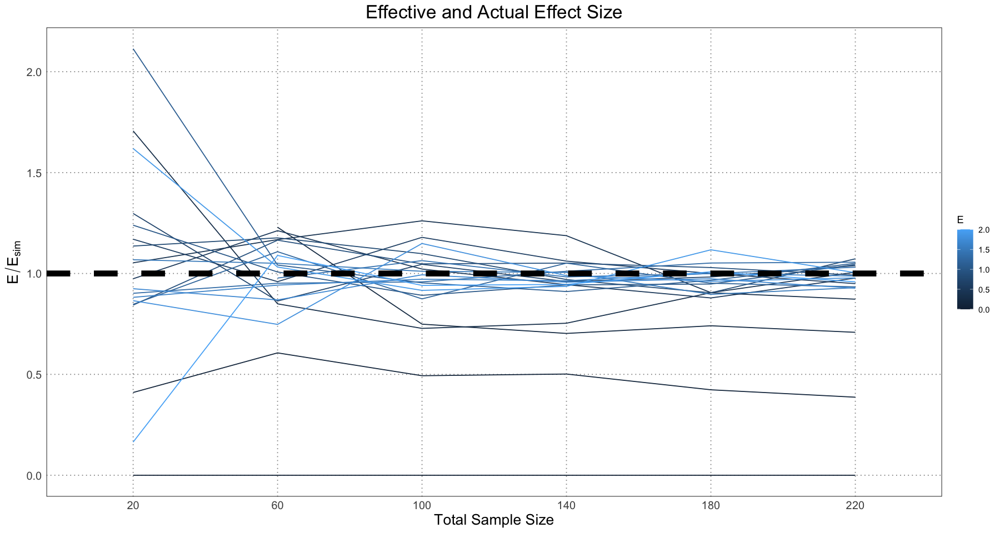

In [253]:
effect_size_df$sample_size <- factor(effect_size_df$sample_size)
effect_size_df$ratio <- effect_size_df$E / effect_size_df$estimated_E
ggplot(effect_size_df, aes(sample_size, ratio, colour = E, group = E)) +
    geom_line() +
    geom_hline(yintercept = 1, linetype = 'dashed', linewidth = 3) +
    labs(title = "Effective and Actual Effect Size", x = "Total Sample Size", y = expression(E / E[sim])) +
    custom_theme()

So, we get the same results as in Figure 9 of the paper. The takeaway here is that the tendency of the model is to overestimate the effect size, but largely the values trend around the true effect. This is what we expect; our model will always separate out the 'male' and 'female' populations into the top and bottom parts of the curve and hence find some level of dimorphism.

Another thing to note here is that there is a large degree of numerical instability. If the sample happens to contain few males or females, or they tend to cluster in one part of the curve (all young or all old) the methods used here often fail to find a good model fit. This is not necessarily a wekness of the model; if there is no information about older individuals then it is just very difficult to make conclusions, such as the asymptotic size, from them. In reality this would be a place for a researcher to step in and set appropriate starting conditions for the curve-fitting, but since here we are trying to simulate hundreds or thousands of samples we are relying on a (sometimes faulty) general method for curve fitting.

## Ruling Out Alternate Hypotheses

The next thing the authors look at is ruling out a wide variety of alternate hypotheses for any observed differences.
1. Controlling for non-sexual variation and polymorphism in populations: this is what we examined earlier when fitting the growth curves, &c.
1. Controlling for ontogenetic variation: largely taken care of by the process of fitting a growth curve
1. Controlling for interspecific variation: essentially, this is checking that the variation you are seeing is actually the result of two closely related species. The authors have a list of recommendations, including trying to get specimens from the same locality and time.
1. Controlling for intra-individual or intra-structural variation: this is a check against the fact that for repeated structures, there might be considerable variation within a single individual. If you have incomplete individuals, each of which preserves only a subset of this highly variable feature, you could get a false dimorphic signal. The authors recommend quantifying this before running an analysis or being careful to only compare analogous features.
1. Controlling for pathological variation: carefully examine bones for signs of pathologies and exclude these from the sample (or otherwise account for them).
1. Taphonomic variation: eliminate highly deformed specimens from the dataset or attempt to un-deform them.

## Biological Implications

Once some idea of the magnitude of dimorphism has been established, you can look at the builogical implications. One conclusion you might draw from the magnitude of dimorphsim is the degree to which the mating behaviours of the sexes are different. In addition, you can draw some conclusions about the degree of monogamy.

Depending on the feature examined, you may also be able to draw some conclusions about the relative role of intersexual and intrasexual competition; if the feature is more likely an 'armament' you can be more certain that intrasexual selection is more important, while if it is more likely and 'ornament' then it is intersexual selection that is the important one.

## Example - Non-avian dinosaur datasets

The authors then looked at three examples of non-avian dinosaurs to apply the method to: *Maiasaura peeblesorum*, *Psittacosaurus lujiatunensis*, and *Tyrannosaurus rex*. They were able to conclude that *Maiasaura* had the largest degree of observed dimorphism, possibly driven by the fact that the *Psittacosaurus* sample lacked older individuals and the *Tyrannosaurus* sample had only a few individuals in it.

The data were taken from a variety of sources: 
- *Maiasaura peeblesorum*: Woodward et al (2015)
- *Psittacosaurus lujiatunensis*: Erickson et al (2015)
- *Tyrannosaurus rex*: Lee & Werning (2008), compiled from Erickson et al (2004) & Horner & Padian (2004), 

One difference between the analyses done thus far and the ones done with the non-avian dinosaurs is that the authors chose to use a logistic curve in order to model the growth. They actually ran each regression twice: once using a Gompertz curve and once using the logistic, but only illustrated the logistic in the paper. In each case, the Gompertz curve yielded biologically implausible values and so was discarded (Saitta et al 2020, Supporting Information, Appendix, Non-avian Dinosaur Analyses).

So, first things first - let's take a look at the data!

In [12]:
df <- read.csv('data/Maiasaura.csv')
head(df)

,Maiasaura.Tibia.Code,Tibia.Length..cm.,Minimum.Diaphyseal.Circumference..cm.,Calculated.Femur.Length..cm.,LAG.Count,LAGs.within.EFS,Age..years.,Age.shift..years.,ROM.44770.femur.length..cm.,ROM.44770.femur.length.cubed..cm3.,ROM.44770.estimated.mass..kg.,Femur.length.cubed..cm3.,Cubed.femur.length.as.a.fraction.of.ROM.44770.cubed.femur.length,Fraction.multiplied.to.ROM.44770.body.mass..kg.
,<chr>,<dbl>,<chr>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,T01,35.0,13,36.2,0,NA,0,0.5,102,1061208,3833,47437.93,0.04470182,171.3421
2,T02,41.5,14.3,43.0,0,NA,0,0.5,NA,NA,NA,79507.00,0.07492122,287.1730
3,T03,33.8,14.4,35.0,0,NA,0,0.5,NA,NA,NA,42875.00,0.04040207,154.8611
4,T04,39.7,14.4,41.1,0,NA,0,0.5,NA,NA,NA,69426.53,0.06542217,250.7632
5,T05,39.4,14.9,40.8,0,NA,0,0.5,NA,NA,NA,67917.31,0.06400000,245.3120
6,T06,46.0,15,47.6,0,NA,0,0.5,NA,NA,NA,107850.18,0.10162963,389.5464


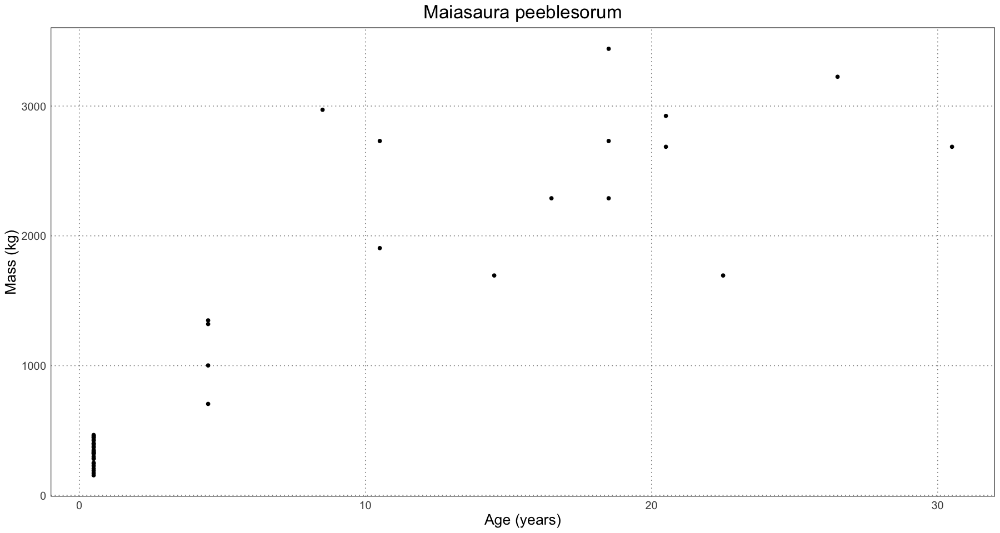

In [13]:
maiasaura <- data.frame(
    age = df$Age..years. + df$Age.shift..years.,
    mass = df$Fraction.multiplied.to.ROM.44770.body.mass..kg.
)
ggplot(maiasaura, aes(age, mass)) +
    geom_point() +
    labs(x = "Age (years)", y = "Mass (kg)", title = "Maiasaura peeblesorum") +
    custom_theme()

In [14]:
df <- read.csv('data/Psittacosaurus.csv')
head(df)

,Specimen,Femur.length..mm.,Age.estimate..years.,Age.estimate.shifted..years.,Femur.length.cubed..mm3.,Largest.specimen..ZMNH.M8138..femur.length.cubed..mm3.,Largest.specimen..ZMNH.M8138..body.mass..kg.,Femur.length.cubed.femur.length.cubed.of.largest.specimen..ZMNH.M8138.,Estimated.body.mass..kg.,We.added.0.5.to.all.datapoints.in.order.to.more.easily.fit.the.curve.when.specimens.have.0.LAGs
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>
1,IVPP 14155,31.0,0,0.5,29791.00,8120601,25.96,0.003668571,0.09523610,"We used ZMNH M8138 as the largest specimen and calculated LPM R00117 based off of this, even though both have the same circumference, because the femurs appear to be 1 cm different in length. We did this to be consistent with the way we calculated body mass of all the other specimens using DME."
2,D2156,32.5,0,0.5,34328.12,NA,NA,0.004227289,0.10974041,"Table 1 lists n=34 for this specimen, but lists a range of femur lengths from 31-34 mm, so we coded 1 specimen with a femur length at the midpoint of this range"
3,IVPP 12704,30.0,0,0.5,27000.00,NA,NA,0.003324877,0.08631381,"For specimens with age estimates <1, we coded as 0 years prior to shift"
4,PKUVP V1058,52.0,0,0.5,140608.00,NA,NA,0.017314975,0.44949674,"Table 1 lists n=2 for this specimen with both femur lengths in parentheses equalling 52 mm, so we coded 2 specimens with femur lengths of 52 mm"
5,PKUVP V1058,52.0,0,0.5,140608.00,NA,NA,0.017314975,0.44949674,
6,LPM R00142,34.0,1,1.5,39304.00,NA,NA,0.004840036,0.12564733,"Table 1 lists n=4 for this specimen, but only presents one femur length in parentheses of 34 mm, so we only coded 1 specimen at 34 mm"


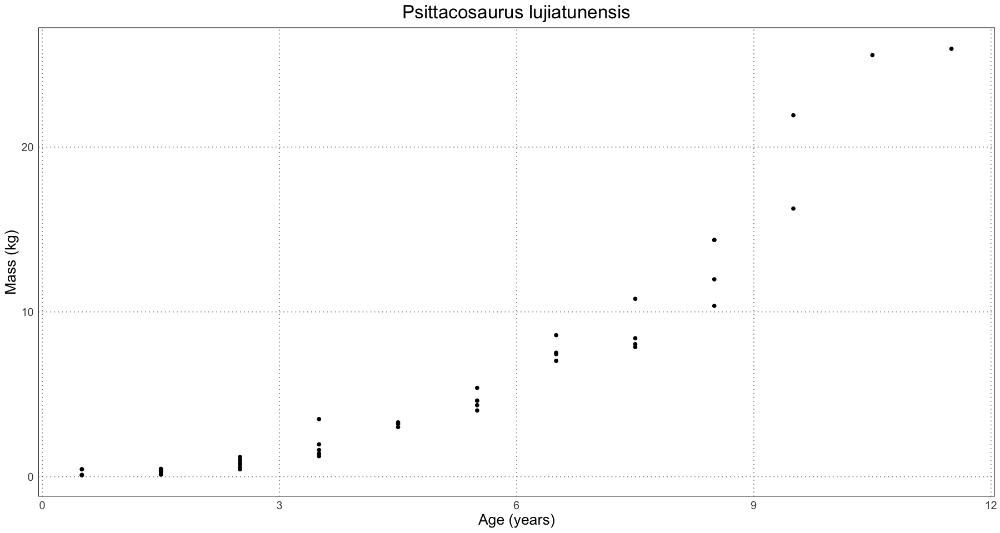

In [15]:
psittacosaurus <- data.frame(
    age = df$Age.estimate.shifted..years.,
    mass = df$Estimated.body.mass..kg.
)
ggplot(psittacosaurus, aes(age, mass)) +
    geom_point() +
    labs(x = "Age (years)", y = "Mass (kg)", title = "Psittacosaurus lujiatunensis") +
    custom_theme()

In [16]:
df <- read.csv('data/Tyrannosaurus.csv')
head(df)

,Specimen,Age..years.,Mass..kg.
,<chr>,<int>,<int>
1,LACM 28471,2,30
2,AMNH 30564,15,1761
3,LACM 23845,14,1807
4,ICM 2001.90.1,16,2984
5,MOR 1125,18,2522
6,RTMP 81.6.1,18,3230


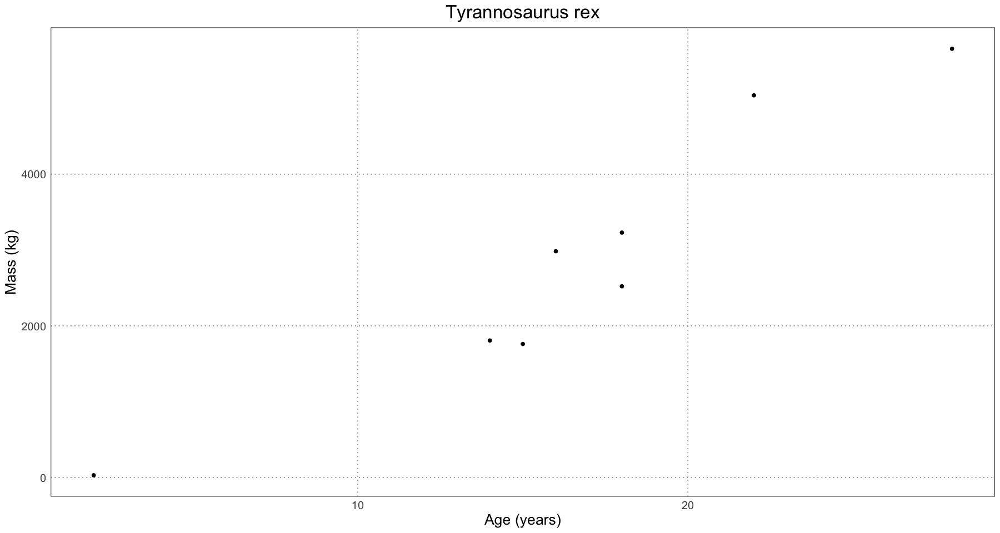

In [44]:
tyrannosaurus <- data.frame(
    age = df$Age..years.,
    mass = df$Mass..kg.
)
ggplot(tyrannosaurus, aes(age, mass)) +
    geom_point() +
    labs(x = "Age (years)", y = "Mass (kg)", title = "Tyrannosaurus rex") +
    custom_theme()

Already we can see that we're dealing with far fewer data points than in the simulation. Let's create the curves for each of these. Remember the process is:
1. Fit a curve to the whole population
1. Predict sex based on residuals
1. Fit curve to each (predicted) sex
1. Get estimate for dimorphism
1. Fit prediction and confidence curves

Recall as well that we're going to fit a logistic rather than the von Bertalanffy curve we used for the alligators.

$$
M = \frac{L}{1 + e^{q+kA}}
$$

Where $M$ is the mass and $A$ is the age. In this case, our level of dimorphism is $L_l - L_s$, where where the two sexes are $l$ (the larger one) and $s$ (the smaller one).

In [45]:
generalized_logistic <- function(age, L, q, k) {
    L / (1 + exp(q + k * age))
}

generate_logistic_curve_fit <- function(df, initial_params, debug = FALSE) {
    fit <- tryCatch({ nlsLM(mass ~ generalized_logistic(age, L, q, k), data = df, start = initial_params) }, error = function(e) {
            cat("Error in generate_curve_fit", conditionMessage(e))
            print(df)
            NULL
        }
    )
    fit
}

In [46]:
# maiasaura
population_fit <- generate_logistic_curve_fit(maiasaura, initial_params=list(
    L=2500,
    k=0.5,
    q=10
))
population_params <- coef(population_fit)

# predict sex using residuals
maiasaura$residuals <- residuals(population_fit)
maiasaura$sex <- ifelse(maiasaura$residuals > 0, "L", "S")

large_fit <- generate_logistic_curve_fit(maiasaura[maiasaura$sex == "L", ], initial_params = population_params)
small_fit <- generate_logistic_curve_fit(maiasaura[maiasaura$sex == "S", ], initial_params = population_params)

# predict growth curve values
prediction_ages <- seq(0, max(maiasaura$age), by = 1)
# prediction_ages <- seq(0, max(maiasaura$age), by = 0.1)
large_prediction_masses <- predict(large_fit, data.frame(age = prediction_ages))
small_prediction_masses <- predict(small_fit, data.frame(age = prediction_ages))

prediction_df <- rbind(
    data.frame(
        age = prediction_ages,
        mass = large_prediction_masses,
        sex = "L",
        type = "Growth Curve"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_masses,
        sex = "S",
        type = "Growth Curve"
    )
)


At this point we can also get the level of dimorphism:

In [47]:
(maiasaura_dimorphism <- coef(large_fit)[['L']] / coef(small_fit)[['L']])

[1] 1.474308

We can interpret this as saying that in *Maiasaura*, we expect that the larger sex is about 47% larger than the smaller one.

In [48]:
# calculate confidence and prediction curves
large_prediction_interval <- predictNLS(large_fit, data.frame(age = prediction_ages), interval = "prediction", level = 0.95)
small_prediction_interval <- predictNLS(small_fit, data.frame(age = prediction_ages), interval = "prediction", level = 0.95)

large_confidence_interval <- predictNLS(large_fit, data.frame(age = prediction_ages), interval = "confidence", level = 0.95)
small_confidence_interval <- predictNLS(small_fit, data.frame(age = prediction_ages), interval = "confidence", level = 0.95)

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #2...

predictNLS: Propagating predictor value #3...

predictNLS: Propagating predictor value #4...

predictNLS: Propagating predictor value #5...

predictNLS: Propagating predictor value #6...

predictNLS: Propagating predictor value #7...

predictNLS: Propagating predictor value #8...

predictNLS: Propagating predictor value #9...

predictNLS: Propagating predictor value #10...

predictNLS: Propagating predictor value #11...

predictNLS: Propagating predictor value #12...

predictNLS: Propagating predictor value #13...

predictNLS: Propagating predictor value #14...

predictNLS: Propagating predictor value #15...

predictNLS: Propagating predictor value #16...

predictNLS: Propagating predictor value #17...

predictNLS: Propagating predictor value #18...

predictNLS: Propagating predictor value #19...

predictNLS: Propagating predictor value #20...

predictNLS: Propagating predictor value #21...

p

In [49]:

interval_df <- rbind(
    data.frame(
        age = prediction_ages,
        mass = large_prediction_interval$summary$`Sim.2.5%`,
        sex = "L",
        type = "Prediction Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_prediction_interval$summary$`Sim.97.5%`,
        sex = "L",
        type = "Prediction Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_interval$summary$`Sim.2.5%`,
        sex = "S",
        type = "Prediction Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_interval$summary$`Sim.97.5%`,
        sex = "S",
        type = "Prediction Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_confidence_interval$summary$`Sim.2.5%`,
        sex = "L",
        type = "Confidence Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_confidence_interval$summary$`Sim.97.5%`,
        sex = "L",
        type = "Confidence Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_confidence_interval$summary$`Sim.2.5%`,
        sex = "S",
        type = "Confidence Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_confidence_interval$summary$`Sim.97.5%`,
        sex = "S",
        type = "Confidence Interval",
        subtype = "Upper"
    )
)

In [1]:
maiasaura_dimorphism

ERROR: Error in eval(expr, envir, enclos): object 'maiasaura_dimorphism' not found


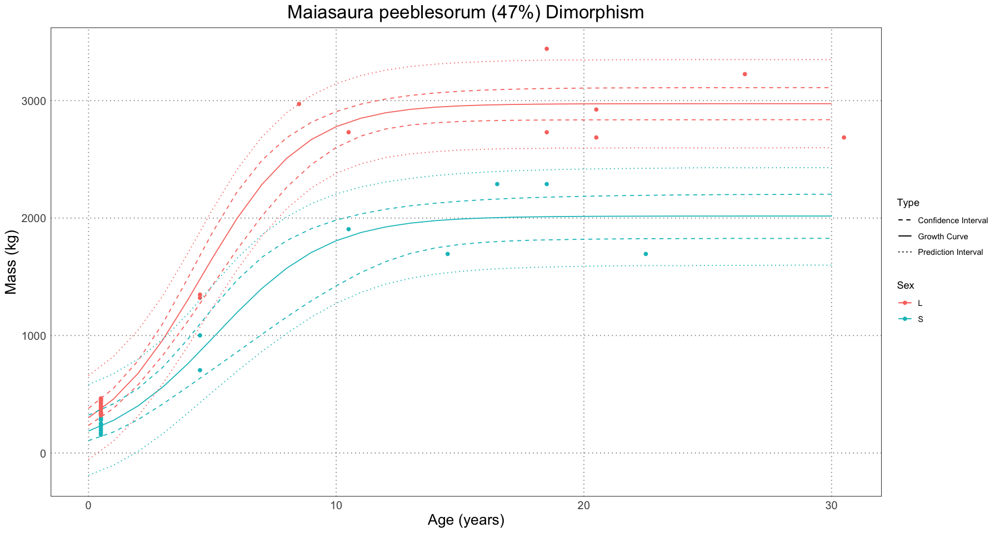

In [50]:
ggplot() +
    geom_point(data = maiasaura, mapping = aes(age, mass, colour = sex)) +
    geom_line(data = prediction_df, mapping = aes(age, mass, colour = sex, linetype = type)) +
    geom_line(data = interval_df, mapping = aes(age, mass, colour = sex, linetype = type, group = interaction(sex, type, subtype))) +
    labs(x = "Age (years)", y = "Mass (kg)", title = paste("Maiasaura peeblesorum (", round(100 * maiasaura_dimorphism - 100), '%) Dimorphism', sep = ''), linetype = "Type", colour = "Sex") +
    scale_linetype_manual(values = c("Growth Curve" = 'solid', "Confidence Interval" = 'dashed', "Prediction Interval" = 'dotted')) +
    custom_theme()

And now we can also get the amount of dimorphism!

In [51]:
coef(large_fit)[['L']] / coef(small_fit)[['L']]

[1] 1.474308

And so, just like in the paper, we have that in *Maiasaura*, the larger sex is about 47% larger than the smaller one!

And now that we've gone through one, let's do the same analysis for the others.

[1] 1.207196

predictNLS: Propagating predictor value #1...



predictNLS: Propagating predictor value #2...

predictNLS: Propagating predictor value #3...

predictNLS: Propagating predictor value #4...

predictNLS: Propagating predictor value #5...

predictNLS: Propagating predictor value #6...

predictNLS: Propagating predictor value #7...

predictNLS: Propagating predictor value #8...

predictNLS: Propagating predictor value #9...

predictNLS: Propagating predictor value #10...

predictNLS: Propagating predictor value #11...

predictNLS: Propagating predictor value #12...

predictNLS: Propagating predictor value #13...

predictNLS: Propagating predictor value #14...

predictNLS: Propagating predictor value #15...

predictNLS: Propagating predictor value #16...

predictNLS: Propagating predictor value #17...

predictNLS: Propagating predictor value #18...

predictNLS: Propagating predictor value #19...

predictNLS: Propagating predictor value #20...

predictNLS: Propagating predictor value #21...

predictNLS: Propagating predictor value #1...

p

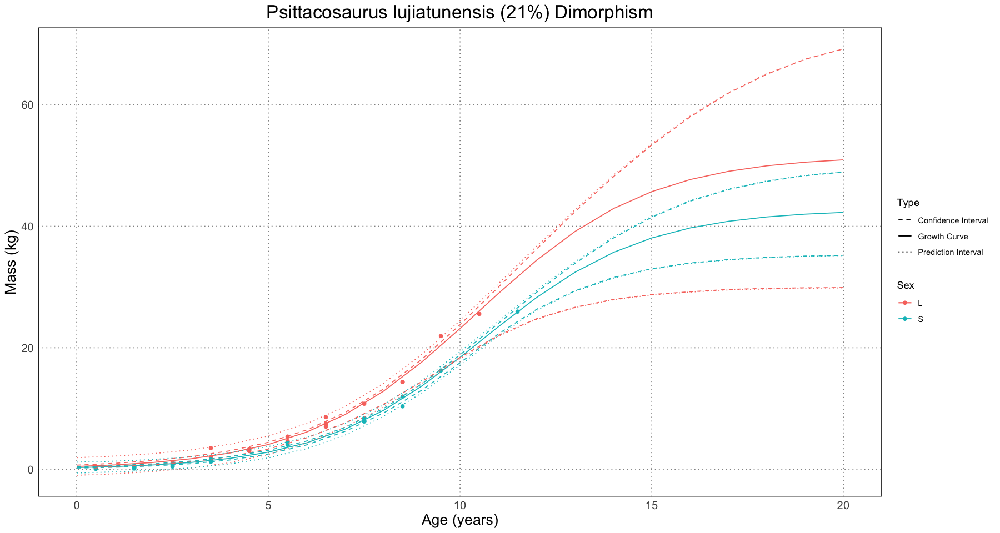

In [52]:

population_data <- psittacosaurus
population_fit <- generate_logistic_curve_fit(population_data, initial_params=list(
    L=37.38,
    k=0.55,
    q=10
))
population_params <- coef(population_fit)

# predict sex using residuals
population_data$residuals <- residuals(population_fit)
population_data$sex <- ifelse(population_data$residuals > 0, "L", "S")

large_fit <- generate_logistic_curve_fit(population_data[population_data$sex == "L", ], initial_params = population_params)
small_fit <- generate_logistic_curve_fit(population_data[population_data$sex == "S", ], initial_params = population_params)

# predict growth curve values
prediction_ages <- seq(0, 20, by = 1)
# prediction_ages <- seq(0, 20, by = 0.1)
large_prediction_masses <- predict(large_fit, data.frame(age = prediction_ages))
small_prediction_masses <- predict(small_fit, data.frame(age = prediction_ages))

prediction_df <- rbind(
    data.frame(
        age = prediction_ages,
        mass = large_prediction_masses,
        sex = "L",
        type = "Growth Curve"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_masses,
        sex = "S",
        type = "Growth Curve"
    )
)

(dimorphism_level <- coef(large_fit)[['L']] / coef(small_fit)[['L']])

# calculate confidence and prediction curves
large_prediction_interval <- predictNLS(large_fit, data.frame(age = prediction_ages), interval = "prediction", level = 0.95)
small_prediction_interval <- predictNLS(small_fit, data.frame(age = prediction_ages), interval = "prediction", level = 0.95)

large_confidence_interval <- predictNLS(large_fit, data.frame(age = prediction_ages), interval = "confidence", level = 0.95)
small_confidence_interval <- predictNLS(small_fit, data.frame(age = prediction_ages), interval = "confidence", level = 0.95)
interval_df <- rbind(
    data.frame(
        age = prediction_ages,
        mass = large_prediction_interval$summary$`Sim.2.5%`,
        sex = "L",
        type = "Prediction Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_prediction_interval$summary$`Sim.97.5%`,
        sex = "L",
        type = "Prediction Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_interval$summary$`Sim.2.5%`,
        sex = "S",
        type = "Prediction Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_interval$summary$`Sim.97.5%`,
        sex = "S",
        type = "Prediction Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_confidence_interval$summary$`Sim.2.5%`,
        sex = "L",
        type = "Confidence Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_confidence_interval$summary$`Sim.97.5%`,
        sex = "L",
        type = "Confidence Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_confidence_interval$summary$`Sim.2.5%`,
        sex = "S",
        type = "Confidence Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_confidence_interval$summary$`Sim.97.5%`,
        sex = "S",
        type = "Confidence Interval",
        subtype = "Upper"
    )
)

ggplot() +
    geom_point(data = population_data, mapping = aes(age, mass, colour = sex)) +
    geom_line(data = prediction_df, mapping = aes(age, mass, colour = sex, linetype = type)) +
    geom_line(data = interval_df, mapping = aes(age, mass, colour = sex, linetype = type, group = interaction(sex, type, subtype))) +
    labs(x = "Age (years)", y = "Mass (kg)", title = paste("Psittacosaurus lujiatunensis (", round(100 * dimorphism_level - 100), '%) Dimorphism', sep = ''), linetype = "Type", colour = "Sex") +
    scale_linetype_manual(values = c("Growth Curve" = 'solid', "Confidence Interval" = 'dashed', "Prediction Interval" = 'dotted')) +
    custom_theme()

In [53]:
population_data <- tyrannosaurus
population_fit <- generate_logistic_curve_fit(population_data, initial_params=list(
    L=5000,
    k=0.5,
    q=10
))
population_params <- coef(population_fit)

# predict sex using residuals
population_data$residuals <- residuals(population_fit)
population_data$sex <- ifelse(population_data$residuals > 0, "L", "S")

large_fit <- generate_logistic_curve_fit(population_data[population_data$sex == "L", ], initial_params = population_params)
small_fit <- generate_logistic_curve_fit(population_data[population_data$sex == "S", ], initial_params = population_params)

# predict growth curve values
prediction_ages <- seq(0, 50, by = 1)
# prediction_ages <- seq(0, 50, by = 0.3)
large_prediction_masses <- predict(large_fit, data.frame(age = prediction_ages))
small_prediction_masses <- predict(small_fit, data.frame(age = prediction_ages))

prediction_df <- rbind(
    data.frame(
        age = prediction_ages,
        mass = large_prediction_masses,
        sex = "L",
        type = "Growth Curve"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_masses,
        sex = "S",
        type = "Growth Curve"
    )
)

(dimorphism_level <- coef(large_fit)[['L']] / coef(small_fit)[['L']])

# calculate confidence and prediction curves
large_prediction_interval <- predictNLS(large_fit, data.frame(age = prediction_ages), interval = "prediction", level = 0.95)
small_prediction_interval <- predictNLS(small_fit, data.frame(age = prediction_ages), interval = "prediction", level = 0.95)

large_confidence_interval <- predictNLS(large_fit, data.frame(age = prediction_ages), interval = "confidence", level = 0.95)
small_confidence_interval <- predictNLS(small_fit, data.frame(age = prediction_ages), interval = "confidence", level = 0.95)
interval_df <- rbind(
    data.frame(
        age = prediction_ages,
        mass = large_prediction_interval$summary$`Sim.2.5%`,
        sex = "L",
        type = "Prediction Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_prediction_interval$summary$`Sim.97.5%`,
        sex = "L",
        type = "Prediction Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_interval$summary$`Sim.2.5%`,
        sex = "S",
        type = "Prediction Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_prediction_interval$summary$`Sim.97.5%`,
        sex = "S",
        type = "Prediction Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_confidence_interval$summary$`Sim.2.5%`,
        sex = "L",
        type = "Confidence Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = large_confidence_interval$summary$`Sim.97.5%`,
        sex = "L",
        type = "Confidence Interval",
        subtype = "Upper"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_confidence_interval$summary$`Sim.2.5%`,
        sex = "S",
        type = "Confidence Interval",
        subtype = "Lower"
    ),
    data.frame(
        age = prediction_ages,
        mass = small_confidence_interval$summary$`Sim.97.5%`,
        sex = "S",
        type = "Confidence Interval",
        subtype = "Upper"
    )
)


Warning message in nls.lm(par = start, fn = FCT, jac = jac, control = control, lower = lower, :
“lmdif: info = -1. Number of iterations has reached `maxiter' == 50.
”


[1] 1.12623

predictNLS: Propagating predictor value #1...

predictNLS: Propagating predictor value #2...

predictNLS: Propagating predictor value #3...

predictNLS: Propagating predictor value #4...

predictNLS: Propagating predictor value #5...

predictNLS: Propagating predictor value #6...

predictNLS: Propagating predictor value #7...

predictNLS: Propagating predictor value #8...

predictNLS: Propagating predictor value #9...

predictNLS: Propagating predictor value #10...

predictNLS: Propagating predictor value #11...

predictNLS: Propagating predictor value #12...

predictNLS: Propagating predictor value #13...

predictNLS: Propagating predictor value #14...

predictNLS: Propagating predictor value #15...

predictNLS: Propagating predictor value #16...

predictNLS: Propagating predictor value #17...

predictNLS: Propagating predictor value #18...

predictNLS: Propagating predictor value #19...

predictNLS: Propagating predictor value #20...

predictNLS: Propagating predictor value #21...

p

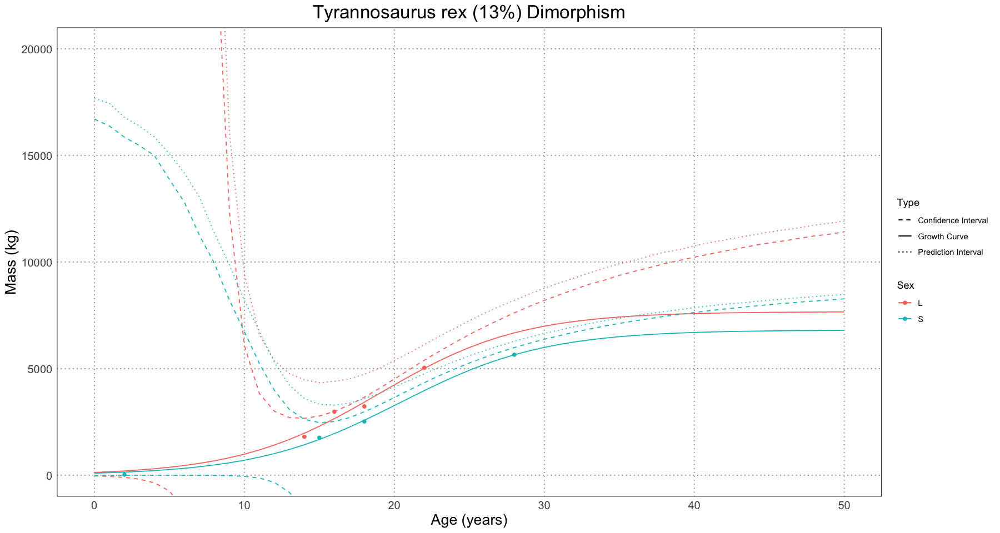

In [54]:
ggplot() +
    geom_point(data = population_data, mapping = aes(age, mass, colour = sex)) +
    geom_line(data = prediction_df, mapping = aes(age, mass, colour = sex, linetype = type)) +
    geom_line(data = interval_df, mapping = aes(age, mass, colour = sex, linetype = type, group = interaction(sex, type, subtype))) +
    labs(x = "Age (years)", y = "Mass (kg)", title = paste("Tyrannosaurus rex (", round(100 * dimorphism_level - 100), '%) Dimorphism', sep = ''), linetype = "Type", colour = "Sex") +
    scale_linetype_manual(values = c("Growth Curve" = 'solid', "Confidence Interval" = 'dashed', "Prediction Interval" = 'dotted')) +
    coord_cartesian(ylim = c(0, 20000)) +
    custom_theme()

These all look like they should (Figure 15 in the paper), with the exception of the *Tyrannosaurus* curve, which shows some differences (particularly in the younger years). However, given that there is so little information, my suspicion is that the sample sizes are just too small to generate a reliable curve and so the differences are largely due to noise. As one example, changing the initial parameters used to set the sex-specific curves from the estimated population parameters to the initial values use to fit the population-level curve bumped the level of dimorphism from 11% to 13% along with some changes to the shape of the confidence and prediction intervals. Overall, there is so much noise here that differences like that are not concerning to me.

## Summary

Again, a very interesting paper! I definitely enjoyed going through and recreating their analysis, which was again made much easier by the easy access to the raw data and code. While there are definiteyl some weak points to this method (the greatest of which, from my perspective, is the circular reasoning of splitting the groups based on assumed dimorphism and then using those groups to find the level of dimorphism), overall I think that it will be a solid place to start to look for dimorphism.

## Bibliography

- Hone, D. W. E., & Mallon, J. C. (2017). Protracted growth impedes the detection of sexual dimorphism in non-avian dinosaurs. Palaeontology, 60(4), 535–545. https://doi.org/10.1111/pala.12298
- Saitta, E. T., Stockdale, M. T., Longrich, N. R., Bonhomme, V., Benton, M. J., Cuthill, I. C., & Makovicky, P. J. (2020). An effect size statistical framework for investigating sexual dimorphism in non-avian dinosaurs and other extinct taxa. Biological Journal of the Linnean Society, 131(2), 231–273. https://doi.org/10.1093/biolinnean/blaa105
- Saitta, Evan et al. (2020). An effect size statistical framework for investigating sexual dimorphism in non-avian dinosaurs and other extinct taxa [Dataset]. Dryad. https://doi.org/10.5061/dryad.kkwh70s2k
- Hartigan, J. A., & Hartigan, P. M. (1985). The Dip Test of Unimodality. The Annals of Statistics, 13(1), 70–84. https://doi.org/10.1214/aos/1176346577
- skeptric—Dip Statistic for Multimodality. (2020, August 21). https://skeptric.com/dip-statistic/index.html
- Mallon, J. C. (2017). Recognizing sexual dimorphism in the fossil record: Lessons from nonavian dinosaurs. Paleobiology, 43(3), 495–507. https://doi.org/10.1017/pab.2016.51
- Wilkinson, P. M., & Rhodes, W. E. (1997). Growth Rates of American Alligators in Coastal South Carolina. The Journal of Wildlife Management, 61(2), 397–402. https://doi.org/10.2307/3802596
- R – fitting data to a mathematical model – Martin Lab. (n.d.). Retrieved January 23, 2024, from https://martinlab.chem.umass.edu/r-fitting-data/
- Prediction interval. (2024). In Wikipedia. https://en.wikipedia.org/w/index.php?title=Prediction_interval&oldid=1197729094
- Erickson, G. M., Makovicky, P. J., Currie, P. J., Norell, M. A., Yerby, S. A., & Brochu, C. A. (2004). Gigantism and comparative life-history parameters of tyrannosaurid dinosaurs. Nature, 430(7001), Article 7001. https://doi.org/10.1038/nature02699
- Erickson, G. M., Makovicky, P. J., Inouye, B. D., Zhou, C., & Gao, K. (2015). Flawed Analysis? A Response to Myhrvold. The Anatomical Record, 298(10), 1669–1672. https://doi.org/10.1002/ar.23187
- Horner, J. R., & Padian, K. (2004). Age and growth dynamics of Tyrannosaurus rex†. Proceedings of the Royal Society of London. Series B: Biological Sciences, 271(1551), 1875–1880. https://doi.org/10.1098/rspb.2004.2829
- Lee, A. H., & Werning, S. (2008). Sexual maturity in growing dinosaurs does not fit reptilian growth models. Proceedings of the National Academy of Sciences, 105(2), 582–587. https://doi.org/10.1073/pnas.0708903105